<a href="https://colab.research.google.com/github/Carlygarciap/Proyecto-Deep-Learning/blob/main/01_Analisis_Motor_etiquetado_de_datos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#<font color="green">**ANÁLISIS MOTORES**</font>

**Carlos Mario García Peña**

**Proyecto Deep Learning**

##<font color="green">**Objetivo de análisis**</font>

El objetivo de aplicar el algoritmo **Isolation Forest** en el análisis de datos de motores eléctricos es identificar y etiquetar de forma precisa los puntos de datos anómalos que podrían indicar condiciones de fallo o deterioro inminente del motor. Para lograr esto, se llevaron a cabo varios pasos en el análisis. Inicialmente, el algoritmo se aplicó de manera individual a los datos de cada motor y, posteriormente, a la combinación de ambos, con el fin de investigar posibles relaciones y patrones en el puntaje de anomalía que pudieran revelar comportamientos inusuales. Estos puntajes se utilizaron para etiquetar los datos mediante el criterio del rango intercuartílico, lo que facilitó la detección de valores extremos de manera robusta. Para complementar este análisis, se crearon visualizaciones detalladas como boxplots y se llevaron a cabo análisis de series temporales, los cuales permitieron observar con mayor claridad en qué fases de las variables clave —corrientes, potencias y voltajes— se producían las anomalías. Este enfoque ayudó a identificar de manera precisa las fases donde se originaron las fallas y evaluar cómo la temperatura influía en el daño del motor, un factor crítico en el diagnóstico de su estado de salud. Finalmente, se revisó la literatura existente para guiar el ajuste de los hiperparámetros del modelo, lo cual permitió establecer un criterio sólido para el cálculo del rango intercuartílico y reforzó la metodología empleada para etiquetar de manera confiable los datos anómalos. Esta combinación de técnicas analíticas y apoyo bibliográfico contribuyó a una comprensión más profunda de las condiciones de funcionamiento del motor y la identificación temprana de posibles problemas.

##<font color="green">**Importamos librerías**</font>

In [1]:
#Cargamos librería

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
%matplotlib inline

#Librerias para ignorar warnings
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

#Librerias para la creación del modelo
from sklearn.ensemble import IsolationForest


##<font color="green">**Preparación de datos**</font>

In [3]:
## Cargamos datos
df = pd.read_csv("/content/drive/MyDrive/data_bici_nueva.csv", sep = ";", na_values = "?")
#df.head()
# filtramos base de datos para motores
df_m1 = df[df["motor"] == 1]
df_m2 = df[df["motor"] == 2]
df_con_motores = df.copy()


In [4]:
# Pasamos variables a factor t fecha a su formato date
df_m1["fecha"] = pd.to_datetime(df_m1["fecha"], format = "%Y%m%d", errors = "coerce")
df_m1["motor"] = df_m1["motor"].astype('category')
df_m1["bateria"] = df_m1["bateria"].astype('category')
df_m1["exp"] = df_m1["exp"].astype('string')
df_m1["lugar"] = df_m1["lugar"].astype('category')
df_m1["ciclo_motor"] = df_m1["ciclo_motor"].astype('category')
df_m1["prueba"] = df_m1["prueba"].astype('category')
df_m1.info()

#motor2
# Pasamos variables a factor t fecha a su formato date
df_m2["fecha"] = pd.to_datetime(df_m2["fecha"], format = "%Y%m%d", errors = "coerce")
df_m2["motor"] = df_m2["motor"].astype('category')
df_m2["bateria"] = df_m2["bateria"].astype('category')
df_m2["exp"] = df_m2["exp"].astype('string')
df_m2["lugar"] = df_m2["lugar"].astype('category')
df_m2["ciclo_motor"] = df_m2["ciclo_motor"].astype('category')
df_m2["prueba"] = df_m2["prueba"].astype('category')

# con todos los datos
df["fecha"] = pd.to_datetime(df["fecha"], format = "%Y%m%d", errors = "coerce")
df["motor"] = df["motor"].astype('category')
df["bateria"] = df["bateria"].astype('category')
df["exp"] = df["exp"].astype('string')
df["lugar"] = df["lugar"].astype('category')
df["ciclo_motor"] = df["ciclo_motor"].astype('category')
df["prueba"] = df["prueba"].astype('category')


<class 'pandas.core.frame.DataFrame'>
Index: 7047 entries, 71839 to 78885
Data columns (total 43 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   prueba             7047 non-null   category      
 1   tiempo             7047 non-null   int64         
 2   fecha_exp          7047 non-null   object        
 3   ciclo_bat          7047 non-null   int64         
 4   ciclo_motor        7047 non-null   category      
 5   fecha              7047 non-null   datetime64[ns]
 6   exp                7047 non-null   string        
 7   motor              7047 non-null   category      
 8   bateria            7047 non-null   category      
 9   peso_cond          7047 non-null   float64       
 10  lugar              7047 non-null   category      
 11  duracion           7047 non-null   object        
 12  distancia          7047 non-null   float64       
 13  vel_max            7047 non-null   float64       
 14  vel_prom

<ipython-input-4-0a7bbb53c05c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_m1["fecha"] = pd.to_datetime(df_m1["fecha"], format = "%Y%m%d", errors = "coerce")
<ipython-input-4-0a7bbb53c05c>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_m1["motor"] = df_m1["motor"].astype('category')
<ipython-input-4-0a7bbb53c05c>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documenta

In [5]:
# Eliminamos variables que no utilizaremos
# Lista de variables a no utilizar
variables_a_eliminar = ["exp", "motor", "bateria", "lugar", "RUL_motor", "RUL_bat", "RUL_reg", "ciclo_bat", "new_time", "vel_max",
                       "vel_prom", "distancia", "duracion", "fecha_exp", "peso_cond", "tiempo", "fecha", "ciclo_motor", "TEMPERATURE_A",
                       "anomaly_score", "anomalias", "ACCELERATION_X","ACCELERATION_Y", "ACCELERATION_Z"]

# Elimina las columnas del DataFrame
df_nuevo_m1 = df_m1.drop(variables_a_eliminar, axis=1)
# "axis=1" Nos indica que queremos eliminar columnas. si fueran filas era "axis=0"

df_nuevo_m1.set_index("prueba", inplace = True)
# Imprime el nuevo DataFrame sin las columnas eliminadas
df_nuevo_m1
#Hacemos una copia1
df_m1_variables = df_nuevo_m1.copy()
df_m1_para_hiperparametros = df_nuevo_m1.copy()
# Lista de variables a no utilizar motor
variables_a_eliminar2 = ["exp", "motor", "bateria", "lugar", "RUL_motor", "RUL_bat", "RUL_reg", "ciclo_bat", "new_time", "vel_max",
                       "vel_prom", "distancia", "duracion", "fecha_exp", "peso_cond", "tiempo", "fecha", "ciclo_motor", "TEMPERATURE_A",
                       "anomaly_score", "anomalias", "ACCELERATION_X","ACCELERATION_Y", "ACCELERATION_Z"]

# Elimina las columnas del DataFrame
df_nuevo_m2 = df_m2.drop(variables_a_eliminar2, axis=1)
# "axis=1" Nos indica que queremos eliminar columnas. si fueran filas era "axis=0"

df_nuevo_m2.set_index("prueba", inplace = True)
# Imprime el nuevo DataFrame sin las columnas eliminadas
df_nuevo_m2
df_m2_variables = df_nuevo_m2.copy()
df_m2_para_hiperparametros = df_nuevo_m2.copy()

#datos completos
variables_a_eliminar3 = ["exp", "motor", "bateria", "lugar", "RUL_motor", "RUL_bat", "RUL_reg", "ciclo_bat", "new_time", "vel_max",
                       "vel_prom", "distancia", "duracion", "fecha_exp", "peso_cond", "tiempo", "fecha", "ciclo_motor", "TEMPERATURE_A",
                       "anomaly_score", "anomalias", "ACCELERATION_X","ACCELERATION_Y", "ACCELERATION_Z"]

# Elimina las columnas del DataFrame
df_m1_m2 = df_con_motores.drop(variables_a_eliminar3, axis=1)
# "axis=1" Nos indica que queremos eliminar columnas. si fueran filas era "axis=0"

df_m1_m2.set_index("prueba", inplace = True)
# Imprime el nuevo DataFrame sin las columnas eliminadas
df_m1_m2
df_completo = df_m1_m2.copy()
df_hiper = df_m1_m2.copy()

# para graficar series temporales
variables_a_eliminar_st = ["exp", "motor", "bateria", "lugar", "RUL_motor", "RUL_bat", "RUL_reg", "ciclo_bat", "new_time", "vel_max",
                       "vel_prom", "distancia", "duracion", "fecha_exp", "peso_cond", "tiempo", "ciclo_motor", "TEMPERATURE_A",
                       "anomaly_score", "anomalias", "ACCELERATION_X","ACCELERATION_Y", "ACCELERATION_Z", "prueba"]

df_para_st = df.drop(variables_a_eliminar_st, axis=1)
df_para_st.set_index("fecha", inplace = True)
df_para_st

# para graficar series temporales

variables_para_st =  ["exp", "motor", "bateria", "lugar", "RUL_motor", "RUL_bat", "RUL_reg", "ciclo_bat", "new_time", "vel_max",
                       "vel_prom", "distancia", "duracion", "fecha_exp", "peso_cond", "tiempo", "ciclo_motor", "TEMPERATURE_A",
                       "anomaly_score", "anomalias", "ACCELERATION_X","ACCELERATION_Y", "ACCELERATION_Z", "prueba", "fecha"]


df_st = df.drop(variables_para_st, axis=1)
df_st

variables_st = ["exp", "motor", "bateria", "lugar", "RUL_motor", "RUL_bat", "RUL_reg", "ciclo_bat", "new_time", "vel_max",
                       "vel_prom", "distancia", "duracion", "fecha_exp", "peso_cond", "TEMPERATURE_A",
                       "anomaly_score", "anomalias", "ACCELERATION_X","ACCELERATION_Y", "ACCELERATION_Z", "prueba", "fecha"]

df_st2 = df.drop(variables_st, axis=1)
df_st

,CURRENT_A_CALC,CURRENT_B_CALC,CURRENT_C_CALC,CURRENT_D_CALC,POWER_A,POWER_B,POWER_C,POWER_D,TEMPERATURE_B,TEMPERATURE_C,TEMPERATURE_D,VOLTAGE_A,VOLTAGE_B,VOLTAGE_C,VOLTAGE_D,ENV_HUMIDITY,ENV_TEMPERATURE,TEMPERATURE_MOTOR
0,0.15,0.08,0.080,0.090,0.00,0.00,0.00,0.00,20.63,20.85,20.850,41.64,20.31,20.210,20.31,70.56,23.11,0.00
1,0.14,0.08,0.090,0.070,0.00,0.00,0.00,0.00,20.63,20.63,20.630,41.64,20.31,20.210,20.31,70.56,23.11,0.00
2,0.15,0.09,0.070,0.060,0.00,0.00,0.00,0.00,20.63,20.63,20.630,41.64,20.31,20.210,20.31,70.56,23.11,0.00
3,0.19,0.08,0.090,0.100,0.00,0.00,0.00,0.01,20.63,20.54,20.540,41.62,20.30,20.210,20.30,70.56,23.11,0.00
4,0.16,0.07,0.070,0.070,0.00,0.00,0.00,0.00,20.63,20.54,20.540,41.62,20.30,20.210,20.30,70.56,23.11,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78881,0.42,11.29,8.460,7.110,0.01,0.58,0.44,0.37,54.58,54.58,54.210,30.39,14.82,14.765,14.83,70.92,22.72,31.21
78882,0.41,6.44,2.220,8.035,0.01,0.33,0.12,0.15,54.58,54.58,54.115,30.39,14.79,14.760,14.83,70.92,22.72,31.21
78883,0.18,7.18,7.020,8.960,0.01,0.37,0.36,0.46,54.58,54.58,54.020,30.38,14.81,14.750,14.82,70.92,22.72,31.21
78884,0.25,6.24,6.695,0.730,0.01,0.32,0.36,0.04,54.58,54.58,54.020,30.40,14.83,14.750,14.81,70.92,22.72,31.21


#<font color="green">**ANÁLISIS  CON ISOLATION FOREST**</font>

**Objetivo**: Intentar aislar valores atípicos del conjunto de datos. Esta detección de puntos anomalos se basa en modelos de arboles de decisión


**Parámetros clave de Isolation Forest:**

**n_estimators:** Este parámetro determina el número de árboles en el bosque. Un valor más alto puede mejorar la precisión del modelo, pero también aumenta el tiempo de entrenamiento y el uso de memoria. Por lo general, un valor de 100 a 200 suele ser un buen punto de partida.

**contamination:** Representa la proporción esperada de anomalías en el conjunto de datos. Puede ser un valor entre 0 y 0.5, o 'auto' para dejar que el algoritmo lo estime. Ajustar este valor de acuerdo con la cantidad de anomalías esperadas en tu conjunto de datos puede mejorar la detección.

**max_samples:** Es la cantidad de muestras que se usarán para entrenar cada árbol. Puede ser un número entero o una fracción del total de datos. Un valor más bajo puede aumentar la variabilidad entre los árboles, lo que a veces puede ser beneficioso para la detección de anomalías.

**max_features:** Indica el número máximo de características a considerar al dividir un nodo. Puede ser un número entero, una fracción o 'auto', que usa la raíz cuadrada del número total de características. Un valor más bajo puede introducir más variabilidad, similar a "max_samples"

In [ ]:
anomaly_input_prueba = ["POWER_B", "POWER_C"]
model_IF_prueba = IsolationForest(n_estimators=100, max_samples="auto", contamination="auto", random_state=42)
model_IF_prueba.fit(df_nuevo_m1[anomaly_input_prueba])

IsolationForest(random_state=42)

In [ ]:
df_nuevo_m1["anomaly_score"] = model_IF_prueba.decision_function(df_nuevo_m1[anomaly_input_prueba])
df_nuevo_m1["anomalia"] = model_IF_prueba.predict(df_nuevo_m1[anomaly_input_prueba])
df_nuevo_m1.loc[:, ["POWER_B", "POWER_C", "anomaly_score", "anomalia"] ]

,POWER_B,POWER_C,anomaly_score,anomalia
prueba,,,,
71840,0.00,0.00,0.100449,1
71841,0.00,0.00,0.100449,1
71842,0.00,0.00,0.100449,1
71843,0.00,0.00,0.100449,1
71844,0.00,0.00,0.100449,1
...,...,...,...,...
78882,0.58,0.44,-0.026301,-1
78883,0.33,0.12,-0.128867,-1
78884,0.37,0.36,0.015102,1


In [ ]:
def outlier_plot(data, outlier_method_name, x_var, y_var,
                 xaxis_limits=[0,1], yaxis_limits=[0,1]):

    print(f'Outlier Method: {outlier_method_name}')

    method = f'{outlier_method_name}_anomalia'

    print(f"Number of anomalous values {len(data[data['anomalia']==-1])}")
    print(f"Number of non anomalous values  {len(data[data['anomalia']== 1])}")
    print(f'Total Number of Values: {len(data)}')

    g = sns.FacetGrid(data, col='anomalia', height=4, hue='anomalia', hue_order=[1,-1])
    g.map(sns.scatterplot, x_var, y_var)
    g.fig.suptitle(f'Outlier Method: {outlier_method_name}', y=1.10, fontweight='bold')
    g.set(xlim=xaxis_limits, ylim=yaxis_limits)
    axes = g.axes.flatten()
    axes[0].set_title(f"Outliers\n{len(data[data['anomalia']== -1])} points")
    axes[1].set_title(f"Inliers\n {len(data[data['anomalia']==  1])} points")
    return g


Outlier Method: Isolation Forest
Number of anomalous values 1437
Number of non anomalous values  5610
Total Number of Values: 7047


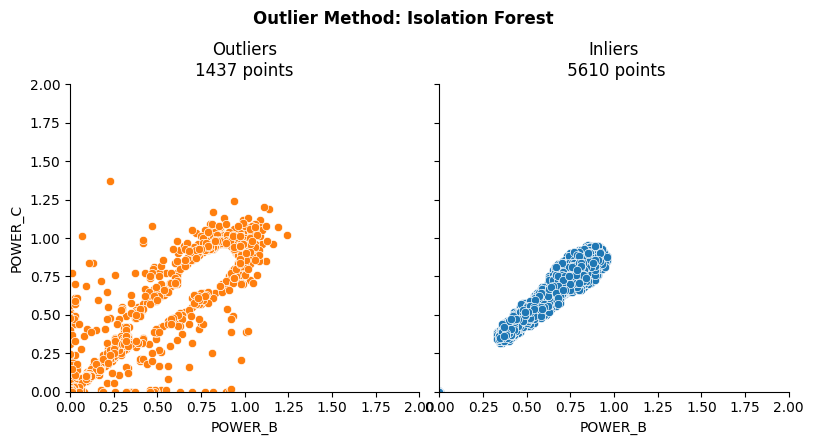

In [ ]:
outlier_plot(df_nuevo_m1, 'Isolation Forest', 'POWER_B', 'POWER_C', [0, 2], [0, 2]);

##<font color="green">**Ahora lo hacemos con todas las variables**</font>

In [ ]:
anomaly_inputs2 = ["CURRENT_A_CALC",  "CURRENT_B_CALC",  "CURRENT_C_CALC",  "CURRENT_D_CALC", "TEMPERATURE_MOTOR", "POWER_A",
                  "POWER_B", "POWER_C", "POWER_D", "VOLTAGE_A", "VOLTAGE_B", "VOLTAGE_C", "VOLTAGE_D", "ENV_TEMPERATURE", "ENV_HUMIDITY"]
model_IF2 = IsolationForest(n_estimators=100, contamination="auto", max_samples="auto", random_state=42) # consideran
model_IF2.fit(df_m1_variables[anomaly_inputs2])
df_m1_variables['anomaly_scores'] = model_IF2.decision_function(df_m1_variables[anomaly_inputs2])
#df_m1_variables['anomaly'] = model_IF2.predict(df_m1_variables[anomaly_inputs2])
df_m1_variables

,CURRENT_A_CALC,CURRENT_B_CALC,CURRENT_C_CALC,CURRENT_D_CALC,POWER_A,POWER_B,POWER_C,POWER_D,TEMPERATURE_B,TEMPERATURE_C,TEMPERATURE_D,VOLTAGE_A,VOLTAGE_B,VOLTAGE_C,VOLTAGE_D,ENV_HUMIDITY,ENV_TEMPERATURE,TEMPERATURE_MOTOR,anomaly_scores
prueba,,,,,,,,,,,,,,,,,,,
71840,0.14,0.06,0.080,0.080,0.00,0.00,0.00,0.00,21.24,21.29,21.240,41.70,20.34,20.250,20.35,65.82,23.25,0.00,0.027754
71841,0.19,0.09,0.070,0.080,0.00,0.00,0.00,0.00,21.24,21.29,21.240,41.71,20.34,20.240,20.34,65.82,23.25,0.00,0.025498
71842,0.10,0.09,0.040,0.080,0.00,0.00,0.00,0.00,21.29,21.16,21.160,41.71,20.34,20.250,20.34,65.82,23.25,0.00,0.010821
71843,0.15,0.07,0.100,0.090,0.00,0.00,0.00,0.00,21.29,21.16,21.160,41.71,20.34,20.250,20.34,65.82,23.25,0.00,0.018155
71844,0.17,0.08,0.090,0.100,0.00,0.00,0.00,0.01,21.33,21.16,21.330,41.71,20.34,20.250,20.34,65.82,23.25,0.00,0.012512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78882,0.42,11.29,8.460,7.110,0.01,0.58,0.44,0.37,54.58,54.58,54.210,30.39,14.82,14.765,14.83,70.92,22.72,31.21,-0.055472
78883,0.41,6.44,2.220,8.035,0.01,0.33,0.12,0.15,54.58,54.58,54.115,30.39,14.79,14.760,14.83,70.92,22.72,31.21,-0.090086
78884,0.18,7.18,7.020,8.960,0.01,0.37,0.36,0.46,54.58,54.58,54.020,30.38,14.81,14.750,14.82,70.92,22.72,31.21,-0.051618


In [ ]:
#sns.pairplot(df_m1_variables, vars=anomaly_inputs2, hue="anomaly", palette="Set1")

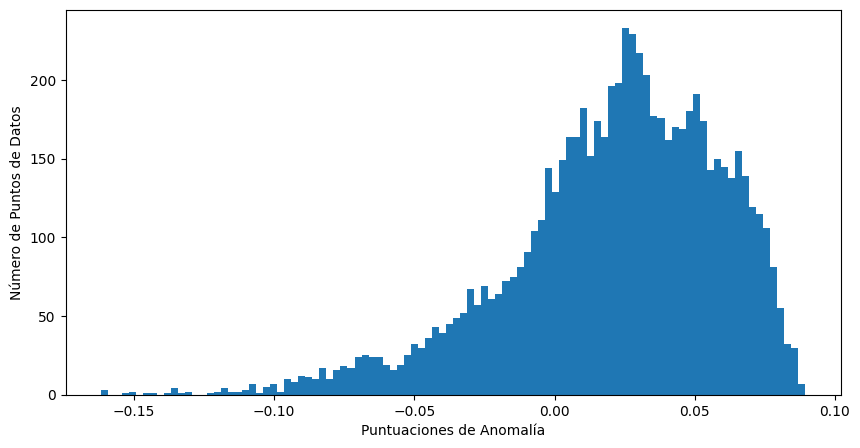

In [ ]:
plt.figure(figsize=(10, 5))
plt.hist(df_m1_variables.anomaly_scores, bins=100)
plt.xlabel("Puntuaciones de Anomalía")
plt.ylabel("Número de Puntos de Datos")
plt.show()

##<font color="green">**Análisis de variables con anomalías**</font>

In [ ]:
# Análisis Descriptivo
print(df_m1_variables.describe())


       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count     7047.000000     7047.000000     7047.000000     7047.000000   
mean         1.787974        9.346260        9.354233        9.378201   
std          1.346043        6.654301        6.637763        6.622113   
min          0.000000        0.000000        0.000000        0.000000   
25%          0.180000        0.100000        0.100000        0.110000   
50%          1.970000       11.180000       11.070000       11.190000   
75%          2.960000       15.145000       15.138333       15.170000   
max         12.370000       23.990000       26.350000       23.170000   

           POWER_A      POWER_B      POWER_C      POWER_D  TEMPERATURE_B  \
count  7047.000000  7047.000000  7047.000000  7047.000000    7047.000000   
mean      0.052691     0.483096     0.484320     0.483604      36.732596   
std       0.041897     0.346871     0.345778     0.344829      11.766365   
min       0.000000     0.000000     0.

# <font color="green">**Calculamos umbral de anomalia para motor 1**</font>

In [ ]:
p= 0.049445 - 0.000715
d= 0.049445+1.5*0.04873
p, d

(0.04873, 0.12254000000000001)

In [ ]:
# Calculo del rango intercualtilico para anomaly_score
Q1 = df_m1_variables.anomaly_scores.quantile(0.25)
Q3 = df_m1_variables.anomaly_scores.quantile(0.75)
IQR = Q3 - Q1
# Calculamos el umbral de anomalia considerando datos atípicos
umbral_anomalia = Q1 - 1.5*IQR
umbral_anomalia

-0.07237971414165405

In [ ]:
# Calculo del rango intercualtilico para anomaly_score

Q1 = df_m1_variables.anomaly_scores.quantile(0.25)
Q3 = df_m1_variables.anomaly_scores.quantile(0.75)
IQR = Q3 - Q1
# Calculamos el umbral considerando datos atipicos hacia la derecha

umbral_anomalia = Q3 + 1.5*IQR
umbral_anomalia


0.1225394963836078

## <font color="green">**Obtenemos etiquetas**</font>

In [ ]:
# Definir el umbral para las anomalías
threshold = -0.07237971414165405
 #Buscar justificarlo

# Asignamos etiquetas: 1 para anomalía, 0 para normal
# Si la puntuación de anomalía es menor que el umbral, es una anomalía (etiqueta 1)
# Si la puntuación de anomalía es mayor o igual que el umbral, es normal (etiqueta 0)
labels = np.where(df_m1_variables.anomaly_scores < threshold, 1, 0)

#'labels' contiene las etiquetas para cada punto de datos en df
# 1 indica una anomalía, 0 indica un punto de datos normal

# Agregamos etiquetas al DataFrame:
df_m1_variables["anomaly"] = labels
#df["anomaly_label"] = labels
#df["anomaly_scores"] = anomaly_scores

In [ ]:
df_m1_variables.anomaly.value_counts()

,count
anomaly,
0,6874
1,173


In [ ]:
falla = (173/len(df_m1_variables))*100
falla

2.4549453668227614

In [ ]:
# Calculamos los percentiles para saber donde se encuentra el umbral

percentiles = np.linspace(0, 1, 101)

# Calculamos los percentiles
percentiles_calculados = df_m1_variables.anomaly_scores.quantile(percentiles)

# Muestra los resultados
print(percentiles_calculados.to_string())

0.00   -0.161778
0.01   -0.091273
0.02   -0.077012
0.03   -0.068423
0.04   -0.060641
0.05   -0.051348
0.06   -0.045779
0.07   -0.041320
0.08   -0.037088
0.09   -0.033492
0.10   -0.030425
0.11   -0.027709
0.12   -0.024647
0.13   -0.021796
0.14   -0.019238
0.15   -0.016664
0.16   -0.014403
0.17   -0.011945
0.18   -0.009856
0.19   -0.008119
0.20   -0.006258
0.21   -0.004808
0.22   -0.003203
0.23   -0.002074
0.24   -0.000711
0.25    0.000715
0.26    0.001945
0.27    0.003080
0.28    0.004345
0.29    0.005336
0.30    0.006498
0.31    0.007561
0.32    0.008591
0.33    0.009724
0.34    0.010653
0.35    0.011581
0.36    0.012643
0.37    0.013893
0.38    0.014903
0.39    0.015976
0.40    0.017065
0.41    0.018093
0.42    0.019162
0.43    0.020028
0.44    0.020884
0.45    0.021928
0.46    0.022842
0.47    0.023799
0.48    0.024559
0.49    0.025253
0.50    0.026032
0.51    0.026844
0.52    0.027510
0.53    0.028387
0.54    0.029068
0.55    0.029934
0.56    0.030663
0.57    0.031563
0.58    0.0323

In [ ]:
# Análisis estadístico descriptivo de cada anomaly
for i in [0, 1]:  # Itera sobre las 2 anomaly: 0 y 1
    anomaly_data = df_m1_variables[df_m1_variables["anomaly"] == i]  # Filtra los datos del anomaly i
    print(f"\nanomaly {i}:")
    print(anomaly_data.describe())  # Muestra estadísticas


anomaly 0:
       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count     6874.000000     6874.000000     6874.000000     6874.000000   
mean         1.796657        9.368460        9.360896        9.391951   
std          1.314411        6.630093        6.613286        6.584762   
min          0.000000        0.000000        0.000000        0.000000   
25%          0.180000        0.100000        0.100000        0.110000   
50%          1.990000       11.260000       11.120000       11.260000   
75%          2.970000       15.140000       15.127500       15.150000   
max          5.000000       21.850000       22.630000       22.100000   

           POWER_A      POWER_B      POWER_C      POWER_D  TEMPERATURE_B  \
count  6874.000000  6874.000000  6874.000000  6874.000000    6874.000000   
mean      0.052994     0.484361     0.484700     0.484070      36.887450   
std       0.040973     0.345633     0.343966     0.342996      11.733147   
min       0.000000     0.0

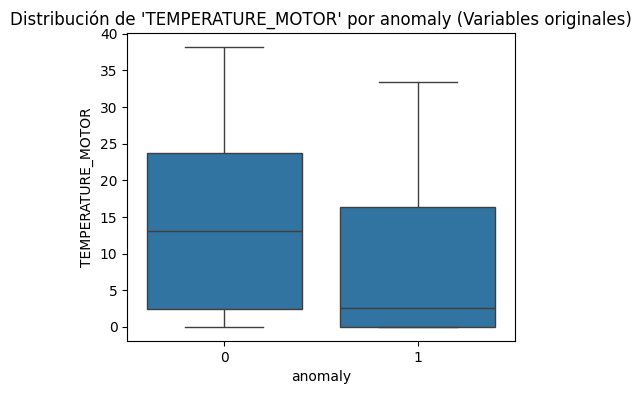

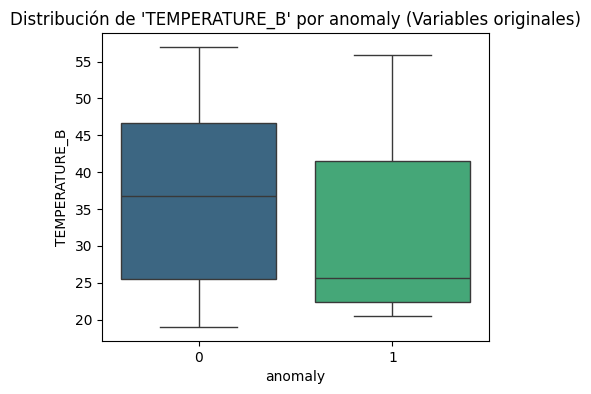

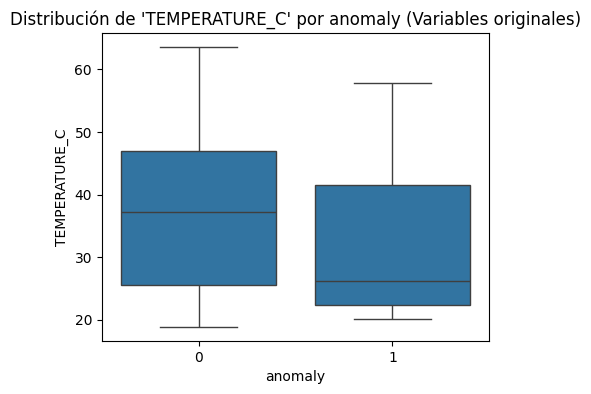

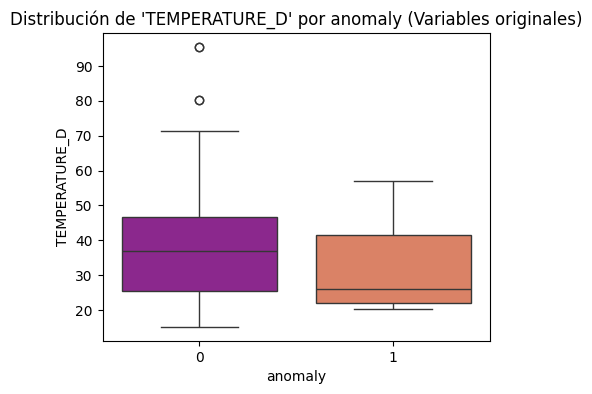

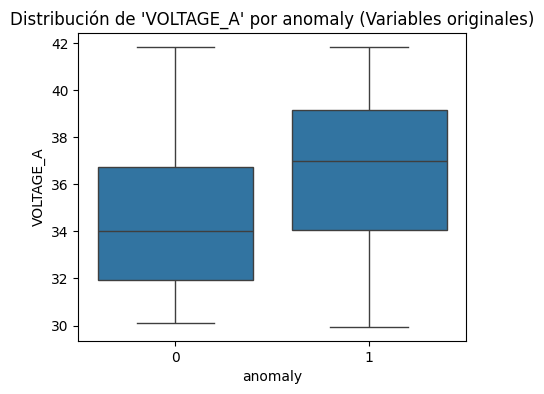

...

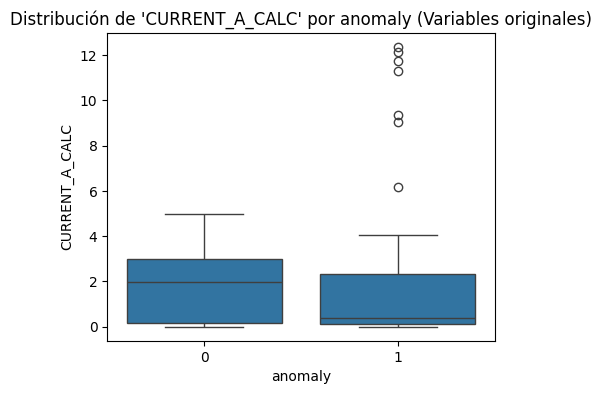

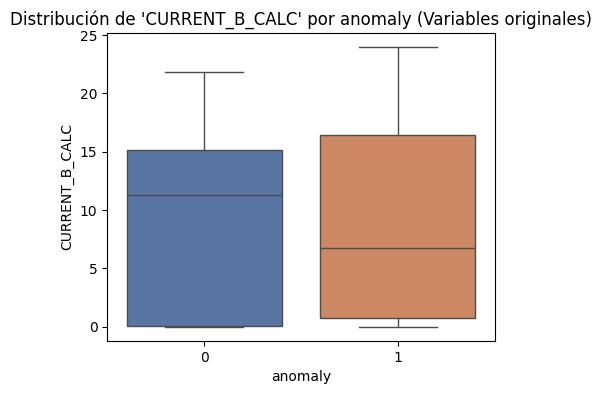

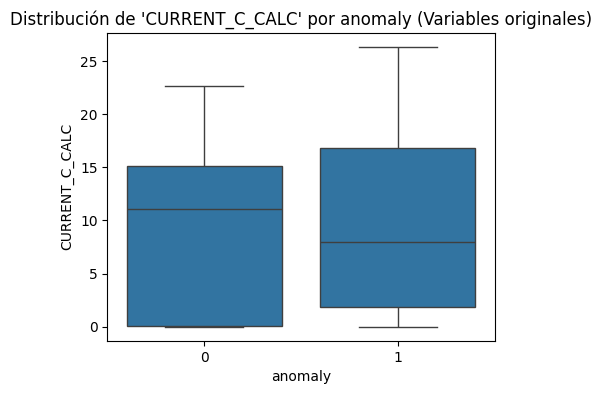

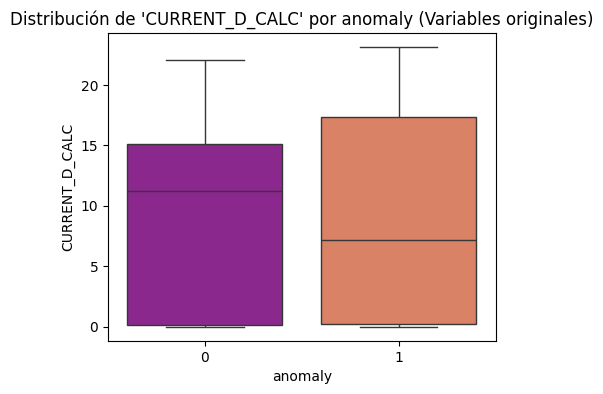

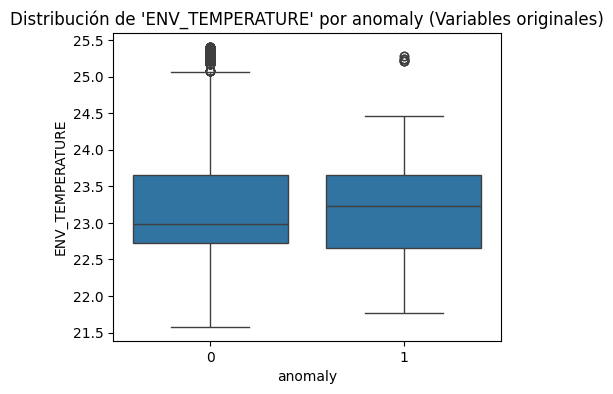

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.10/dist-packages/matplotlib/pyplot.py'>

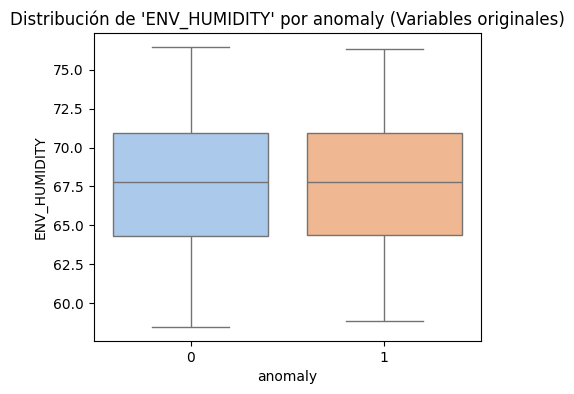

In [ ]:
# Boxplot para las variables
#temperaturas
plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_MOTOR", data=df_m1_variables)
plt.title("Distribución de 'TEMPERATURE_MOTOR' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_B", data=df_m1_variables, palette="viridis")
plt.title("Distribución de 'TEMPERATURE_B' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_C", data=df_m1_variables)
plt.title("Distribución de 'TEMPERATURE_C' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_D", data=df_m1_variables, palette="plasma")
plt.title("Distribución de 'TEMPERATURE_D' por anomaly (Variables originales)")
plt.show()

# Voltajes

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_A", data=df_m1_variables)
plt.title("Distribución de 'VOLTAGE_A' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_B", data=df_m1_variables, palette="deep")
plt.title("Distribución de 'VOLTAGE_B' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_C", data=df_m1_variables, palette="viridis")
plt.title("Distribución de 'VOLTAGE_C' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_D", data=df_m1_variables)
plt.title("Distribución de 'VOLTAGE_D' por anomaly (Variables originales)")
plt.show()

#Potencias

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_A", data=df_m1_variables, palette="plasma")
plt.title("Distribución de 'POWER_A' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_B", data=df_m1_variables, palette="viridis")
plt.title("Distribución de 'POWER_B' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_C", data=df_m1_variables)
plt.title("Distribución de 'POWER_C' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_D", data=df_m1_variables, palette="pastel")
plt.title("Distribución de 'POWER_D' por anomaly (Variables originales)")
plt.show()

#Corrientes

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_A_CALC", data=df_m1_variables)
plt.title("Distribución de 'CURRENT_A_CALC' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_B_CALC", data=df_m1_variables, palette="deep")
plt.title("Distribución de 'CURRENT_B_CALC' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_C_CALC", data=df_m1_variables)
plt.title("Distribución de 'CURRENT_C_CALC' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_D_CALC", data=df_m1_variables, palette="plasma")
plt.title("Distribución de 'CURRENT_D_CALC' por anomaly (Variables originales)")
plt

#Condiciones ambientes

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="ENV_TEMPERATURE", data=df_m1_variables)
plt.title("Distribución de 'ENV_TEMPERATURE' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="ENV_HUMIDITY", data=df_m1_variables, palette="pastel")
plt.title("Distribución de 'ENV_HUMIDITY' por anomaly (Variables originales)")
plt






In [ ]:
# Matriz de correlaciones
# Análisis de correlaciones
correlaciones_motor1 = df_m1_variables.corr()
print(correlaciones_motor1)

                   CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  \
CURRENT_A_CALC           1.000000        0.822051        0.811028   
CURRENT_B_CALC           0.822051        1.000000        0.971197   
CURRENT_C_CALC           0.811028        0.971197        1.000000   
CURRENT_D_CALC           0.795840        0.954835        0.964377   
POWER_A                  0.989546        0.837020        0.824716   
POWER_B                  0.822195        0.994525        0.970950   
POWER_C                  0.804351        0.968955        0.986338   
POWER_D                  0.792589        0.953792        0.960142   
TEMPERATURE_B            0.108812        0.242940        0.240444   
TEMPERATURE_C            0.109524        0.243094        0.240624   
TEMPERATURE_D            0.108315        0.239886        0.237398   
VOLTAGE_A               -0.445274       -0.609862       -0.598988   
VOLTAGE_B               -0.435293       -0.613645       -0.604307   
VOLTAGE_C               -0.427049 

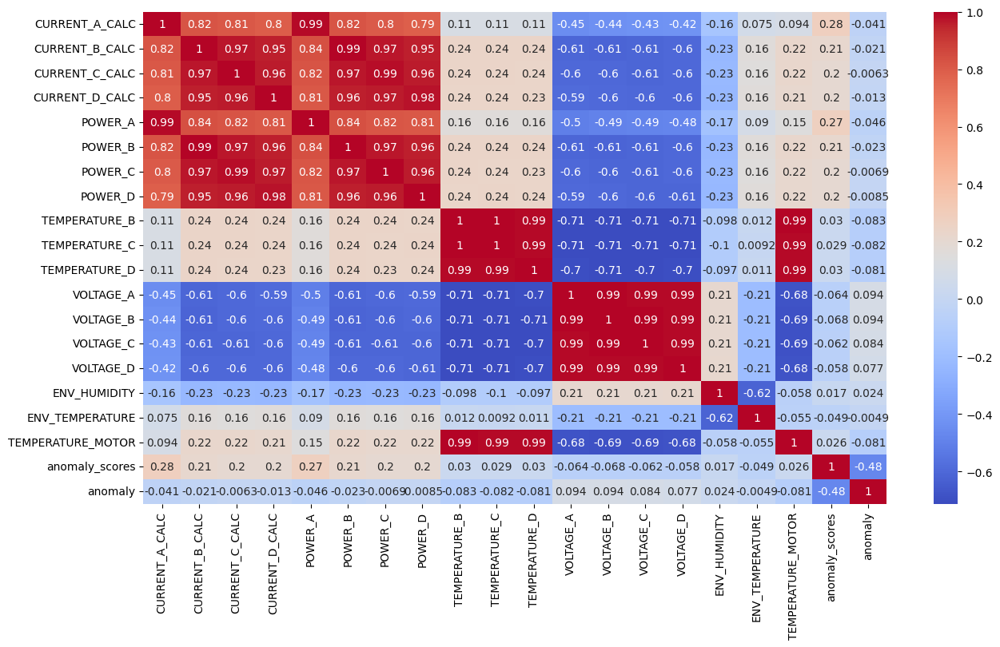

In [ ]:
## Graficamos correlaciones
plt.figure(figsize = (15, 8))
sns.heatmap(correlaciones_motor1, annot = True, cmap = "coolwarm") # heatmap: crea un mapa de calor apartir de la matriz de correlaciones
plt.show()
# annot = Muestra los valores de las correlaciones en cada celda del mapa de calor
# cmap = Colores del mapa de calor

##<font color="green">**Análisis motor 2**</font>

In [ ]:
anomaly_inputs3 = ["CURRENT_A_CALC",  "CURRENT_B_CALC",  "CURRENT_C_CALC",  "CURRENT_D_CALC", "TEMPERATURE_MOTOR", "POWER_A",
                  "POWER_B", "POWER_C", "POWER_D", "VOLTAGE_A", "VOLTAGE_B", "VOLTAGE_C", "VOLTAGE_D", "ENV_TEMPERATURE", "ENV_HUMIDITY"]
model_IF3 = IsolationForest(n_estimators=100, contamination="auto", max_samples="auto", random_state=42) # consideran
model_IF3.fit(df_m2_variables[anomaly_inputs3])
df_m2_variables['anomaly_scores2'] = model_IF3.decision_function(df_m2_variables[anomaly_inputs3])
#df_m2_variables['anomaly2'] = model_IF2.predict(df_m2_variables[anomaly_inputs3])
df_m2_variables

,CURRENT_A_CALC,CURRENT_B_CALC,CURRENT_C_CALC,CURRENT_D_CALC,POWER_A,POWER_B,POWER_C,POWER_D,TEMPERATURE_B,TEMPERATURE_C,TEMPERATURE_D,VOLTAGE_A,VOLTAGE_B,VOLTAGE_C,VOLTAGE_D,ENV_HUMIDITY,ENV_TEMPERATURE,TEMPERATURE_MOTOR,anomaly_scores2
prueba,,,,,,,,,,,,,,,,,,,
1,0.15,0.08,0.08,0.09,0.00,0.00,0.00,0.00,20.63,20.85,20.850000,41.64,20.31,20.21,20.310,70.56,23.11,0.00,-0.003883
2,0.14,0.08,0.09,0.07,0.00,0.00,0.00,0.00,20.63,20.63,20.630000,41.64,20.31,20.21,20.310,70.56,23.11,0.00,-0.007211
3,0.15,0.09,0.07,0.06,0.00,0.00,0.00,0.00,20.63,20.63,20.630000,41.64,20.31,20.21,20.310,70.56,23.11,0.00,-0.008700
3,0.19,0.08,0.09,0.10,0.00,0.00,0.00,0.01,20.63,20.54,20.540000,41.62,20.30,20.21,20.300,70.56,23.11,0.00,-0.014234
5,0.16,0.07,0.07,0.07,0.00,0.00,0.00,0.00,20.63,20.54,20.540000,41.62,20.30,20.21,20.300,70.56,23.11,0.00,-0.004180
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71835,0.34,6.45,1.18,8.90,0.01,0.33,0.06,0.46,97.68,92.83,97.556667,30.42,14.82,14.77,14.830,71.59,21.88,72.26,-0.058631
71836,0.39,9.98,8.51,7.14,0.01,0.52,0.44,0.23,97.68,92.83,97.433333,30.42,14.83,14.75,14.830,71.59,21.88,72.26,-0.044167
71837,0.35,9.32,11.55,0.00,0.01,0.48,0.60,0.00,97.68,92.83,97.310000,30.41,14.84,14.75,14.825,71.59,21.88,72.26,-0.074600


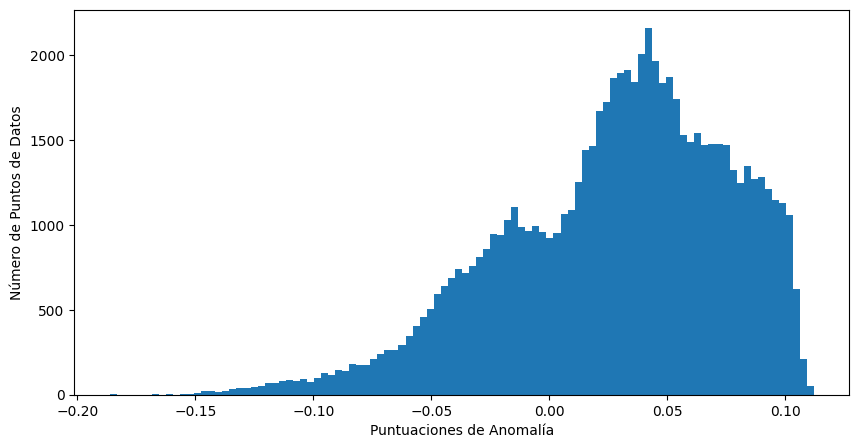

In [ ]:
plt.figure(figsize=(10, 5))
plt.hist(df_m2_variables.anomaly_scores2, bins=100)
plt.xlabel("Puntuaciones de Anomalía")
plt.ylabel("Número de Puntos de Datos")
plt.show()

In [ ]:
# Análisis Descriptivo
print(df_m2_variables.describe())

       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count    71839.000000    71839.000000    71839.000000    71839.000000   
mean         1.577290        7.658274        7.660248        7.668731   
std          1.133045        5.423372        5.411743        5.415251   
min          0.000000        0.000000        0.000000        0.000000   
25%          0.410000        2.270000        2.310000        2.310000   
50%          1.670000        8.020000        8.030000        8.030000   
75%          2.350000       11.130000       11.110000       11.100000   
max         11.660000       27.480000       34.100000       28.220000   

            POWER_A       POWER_B       POWER_C       POWER_D  TEMPERATURE_B  \
count  71839.000000  71839.000000  71839.000000  71839.000000   71839.000000   
mean       0.045293      0.396375      0.396160      0.397055      47.314770   
std        0.034222      0.282967      0.281667      0.282172      18.127126   
min        0.000000   

## <font color="green">**Calculamos umbral de anomalia para motor 2**</font>

In [ ]:
# Calculo del rango intercualtilico para anomaly_score
Q1 = df_m2_variables.anomaly_scores2.quantile(0.25)
Q3 = df_m2_variables.anomaly_scores2.quantile(0.75)
IQR = Q3 - Q1
# Calculamos el umbral de anomalia considerando datos atípicos
umbral_anomalia = Q1 - 1.5*IQR
umbral_anomalia

-0.10535059621725922

In [ ]:
# Calculo del rango intercualtilico para anomaly_score

Q1 = df_m2_variables.anomaly_scores2.quantile(0.25)
Q3 = df_m2_variables.anomaly_scores2.quantile(0.75)
IQR = Q3 - Q1
# Calculamos el umbral considerando datos atipicos hacia la derecha

umbral_anomalia = Q3 + 1.5*IQR
umbral_anomalia

0.1657933301395263

In [ ]:
# Definir el umbral para las anomalías
threshold = -0.10535059621725922
 #Buscar justificarlo

# Asignamos etiquetas: 1 para anomalía, 0 para normal
# Si la puntuación de anomalía es menor que el umbral, es una anomalía (etiqueta 1)
# Si la puntuación de anomalía es mayor o igual que el umbral, es normal (etiqueta 0)
labels = np.where(df_m2_variables.anomaly_scores2 < threshold, 1, 0)

#'labels' contiene las etiquetas para cada punto de datos en df
# 1 indica una anomalía, 0 indica un punto de datos normal

# Agregamos etiquetas al DataFrame:
df_m2_variables["anomaly"] = labels
#df["anomaly_label"] = labels
#df["anomaly_scores"] = anomaly_scores

##<font color="green">**Cálculo de percentiles**</font>

In [ ]:
# Calculamos los percentiles para saber donde se encuentra el umbral

percentiles = np.linspace(0, 1, 101)

# Calculamos los percentiles
percentiles_calculados = df_m2_variables.anomaly_scores2.quantile(percentiles)

# Muestra los resultados
print(percentiles_calculados.to_string())

0.00   -0.186307
0.01   -0.104710
0.02   -0.086054
0.03   -0.073873
0.04   -0.065170
0.05   -0.058340
0.06   -0.053353
0.07   -0.048838
0.08   -0.045303
0.09   -0.042113
0.10   -0.038897
0.11   -0.036045
0.12   -0.033155
0.13   -0.030348
0.14   -0.027736
0.15   -0.025207
0.16   -0.022979
0.17   -0.020679
0.18   -0.018429
0.19   -0.016395
0.20   -0.014601
0.21   -0.012483
0.22   -0.010262
0.23   -0.008130
0.24   -0.005867
0.25   -0.003672
0.26   -0.001465
0.27    0.000880
0.28    0.003123
0.29    0.005288
0.30    0.007273
0.31    0.009304
0.32    0.011248
0.33    0.012981
0.34    0.014508
0.35    0.016014
0.36    0.017472
0.37    0.018904
0.38    0.020296
0.39    0.021646
0.40    0.022841
0.41    0.024059
0.42    0.025318
0.43    0.026490
0.44    0.027644
0.45    0.028790
0.46    0.029872
0.47    0.031094
0.48    0.032181
0.49    0.033327
0.50    0.034418
0.51    0.035532
0.52    0.036735
0.53    0.037864
0.54    0.038896
0.55    0.040012
0.56    0.041041
0.57    0.042053
0.58    0.0430

In [ ]:
# Análisis estadístico descriptivo de cada anomaly
for i in [0, 1]:  # Itera sobre las 2 anomaly: 0 y 1
    anomaly_data2 = df_m2_variables[df_m2_variables["anomaly"] == i]  # Filtra los datos del anomaly i
    print(f"\nanomaly {i}:")
    print(anomaly_data2.describe())  # Muestra estadísticas


anomaly 0:
       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count    71135.000000    71135.000000    71135.000000    71135.000000   
mean         1.583590        7.621059        7.616714        7.616484   
std          1.130453        5.380289        5.367532        5.362425   
min          0.000000        0.000000        0.000000        0.000000   
25%          0.420000        2.250000        2.270000        2.270000   
50%          1.680000        8.010000        8.020000        8.020000   
75%          2.360000       11.050000       11.010000       11.010000   
max         11.660000       26.790000       34.100000       25.640000   

            POWER_A       POWER_B       POWER_C       POWER_D  TEMPERATURE_B  \
count  71135.000000  71135.000000  71135.000000  71135.000000   71135.000000   
mean       0.045468      0.394357      0.394019      0.394322      47.039027   
std        0.034179      0.280662      0.279423      0.279419      17.697476   
min       

In [ ]:
df_m2_variables.anomaly.value_counts()

,count
anomaly,
0,71135
1,704


In [ ]:
falla = (704/len(df_m2_variables))*100
falla

0.9799690975653893

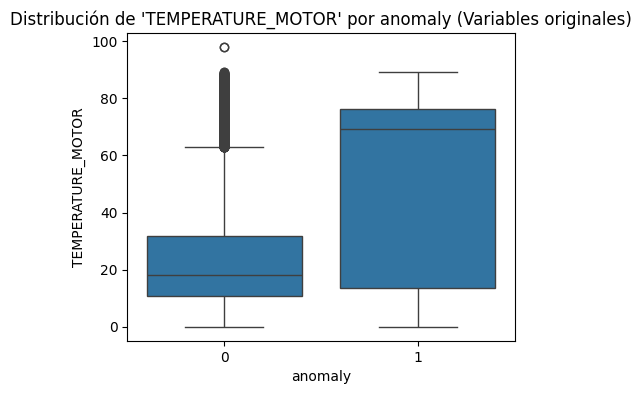

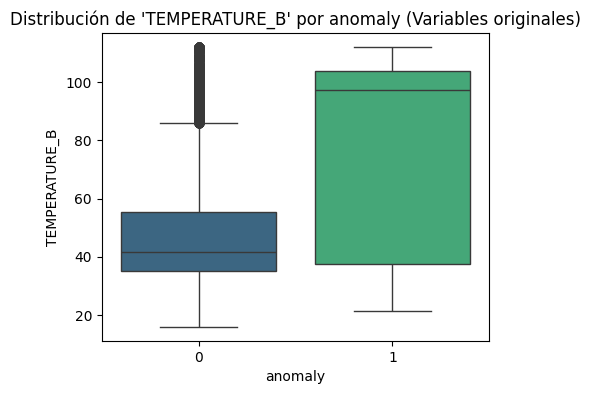

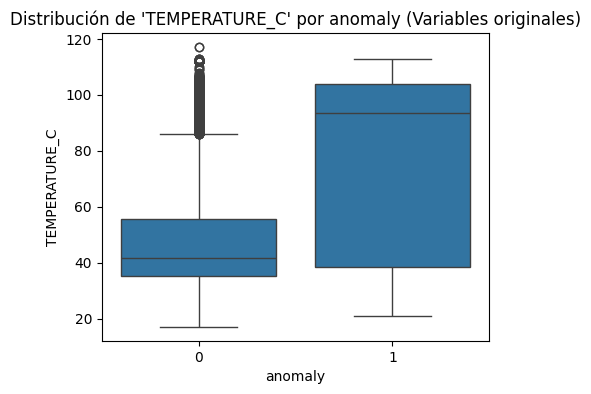

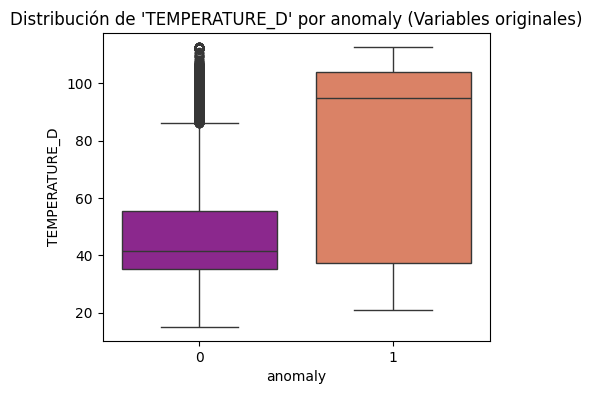

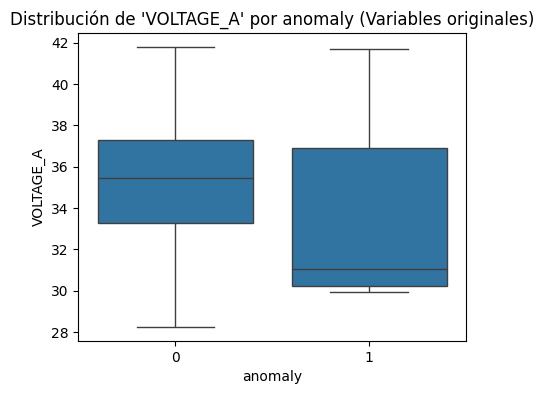

...

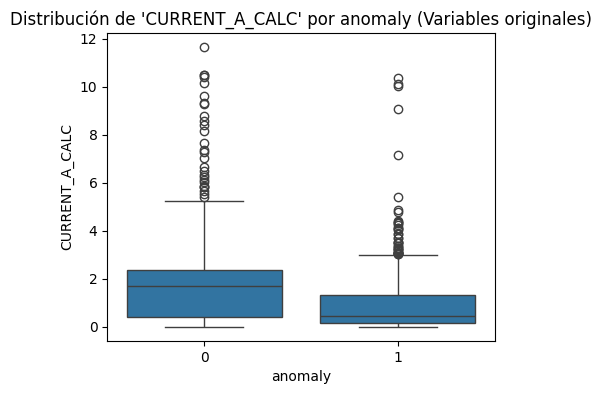

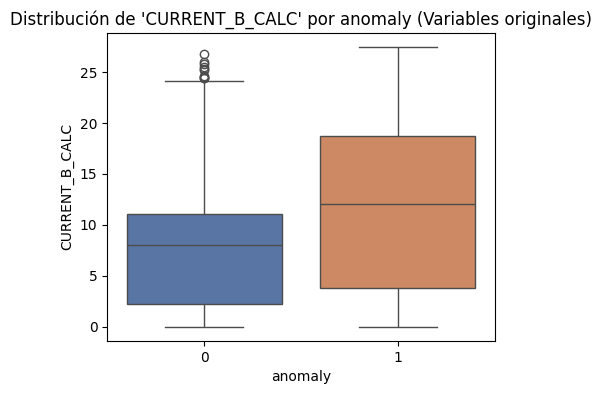

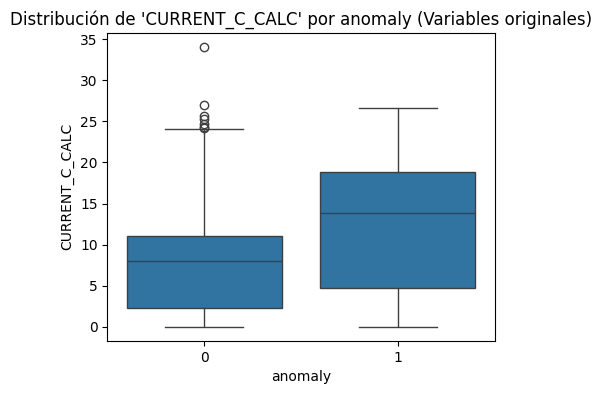

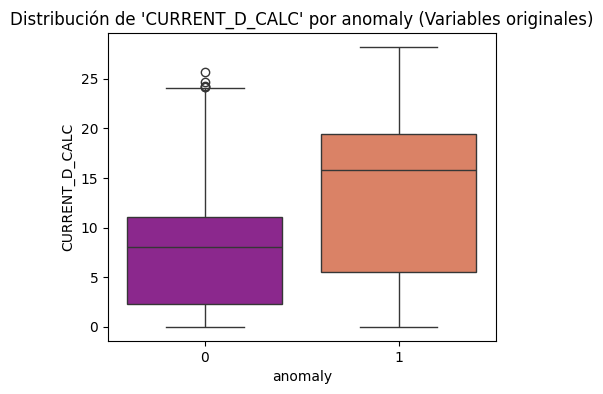

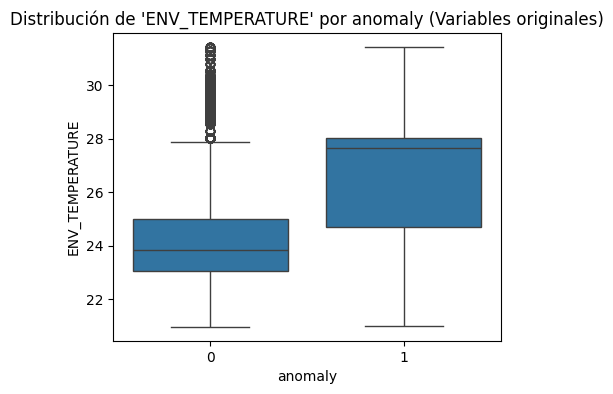

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.10/dist-packages/matplotlib/pyplot.py'>

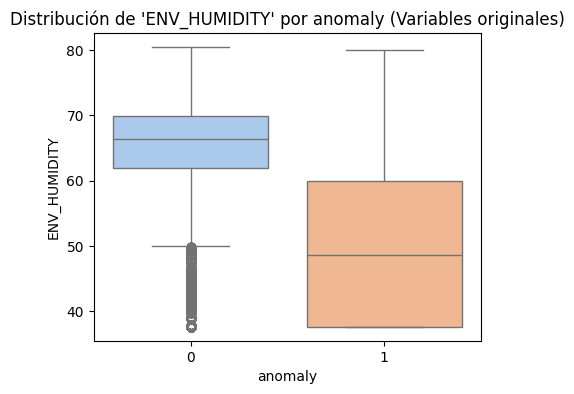

In [ ]:
# Boxplot para las variables
#temperaturas
plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_MOTOR", data=df_m2_variables)
plt.title("Distribución de 'TEMPERATURE_MOTOR' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_B", data=df_m2_variables, palette="viridis")
plt.title("Distribución de 'TEMPERATURE_B' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_C", data=df_m2_variables)
plt.title("Distribución de 'TEMPERATURE_C' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_D", data=df_m2_variables, palette="plasma")
plt.title("Distribución de 'TEMPERATURE_D' por anomaly (Variables originales)")
plt.show()

# Voltajes

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_A", data=df_m2_variables)
plt.title("Distribución de 'VOLTAGE_A' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_B", data=df_m2_variables, palette="deep")
plt.title("Distribución de 'VOLTAGE_B' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_C", data=df_m2_variables, palette="viridis")
plt.title("Distribución de 'VOLTAGE_C' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_D", data=df_m2_variables)
plt.title("Distribución de 'VOLTAGE_D' por anomaly (Variables originales)")
plt.show()

#Potencias

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_A", data=df_m2_variables, palette="plasma")
plt.title("Distribución de 'POWER_A' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_B", data=df_m2_variables, palette="viridis")
plt.title("Distribución de 'POWER_B' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_C", data=df_m2_variables)
plt.title("Distribución de 'POWER_C' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_D", data=df_m2_variables, palette="pastel")
plt.title("Distribución de 'POWER_D' por anomaly (Variables originales)")
plt.show()

#Corrientes

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_A_CALC", data=df_m2_variables)
plt.title("Distribución de 'CURRENT_A_CALC' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_B_CALC", data=df_m2_variables, palette="deep")
plt.title("Distribución de 'CURRENT_B_CALC' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_C_CALC", data=df_m2_variables)
plt.title("Distribución de 'CURRENT_C_CALC' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_D_CALC", data=df_m2_variables, palette="plasma")
plt.title("Distribución de 'CURRENT_D_CALC' por anomaly (Variables originales)")
plt

#Condiciones ambientes

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="ENV_TEMPERATURE", data=df_m2_variables)
plt.title("Distribución de 'ENV_TEMPERATURE' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="ENV_HUMIDITY", data=df_m2_variables, palette="pastel")
plt.title("Distribución de 'ENV_HUMIDITY' por anomaly (Variables originales)")
plt


In [ ]:
# Matriz de correlaciones
# Análisis de correlaciones
correlaciones_motor2 = df_m2_variables.corr()
print(correlaciones_motor2)

                   CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  \
CURRENT_A_CALC           1.000000        0.778983        0.764124   
CURRENT_B_CALC           0.778983        1.000000        0.954067   
CURRENT_C_CALC           0.764124        0.954067        1.000000   
CURRENT_D_CALC           0.746925        0.939694        0.951770   
POWER_A                  0.990784        0.802656        0.787894   
POWER_B                  0.780048        0.990535        0.956148   
POWER_C                  0.764532        0.952582        0.983714   
POWER_D                  0.745878        0.940205        0.950820   
TEMPERATURE_B            0.002127        0.251776        0.251491   
TEMPERATURE_C            0.004328        0.253727        0.253280   
TEMPERATURE_D            0.003960        0.253488        0.253012   
VOLTAGE_A               -0.376303       -0.587090       -0.578270   
VOLTAGE_B               -0.368077       -0.591000       -0.584062   
VOLTAGE_C               -0.361325 

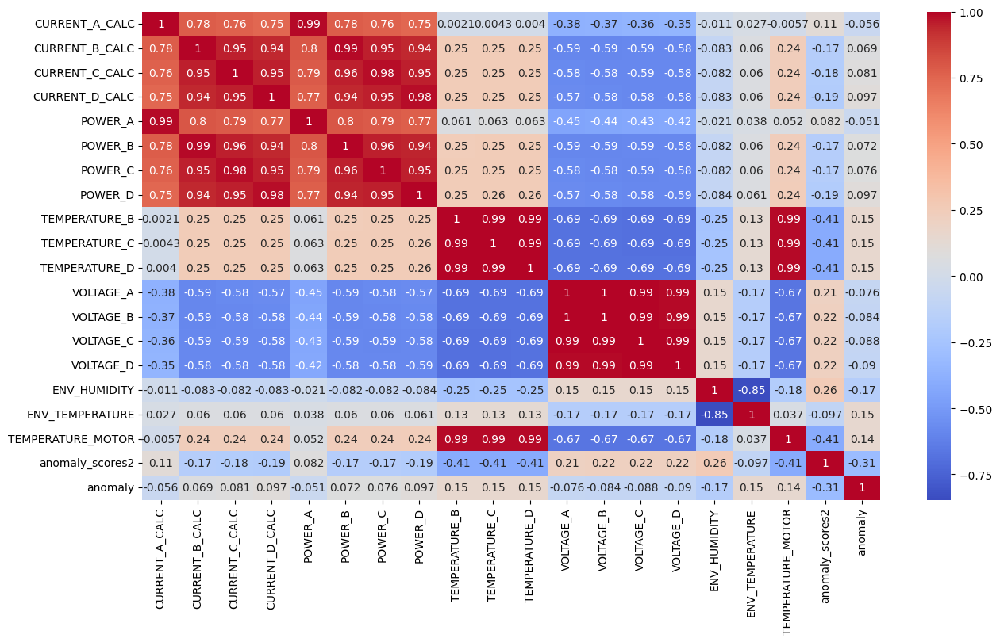

In [ ]:
## Graficamos correlaciones
plt.figure(figsize = (15, 8))
sns.heatmap(correlaciones_motor2, annot = True, cmap = "coolwarm") # heatmap: crea un mapa de calor apartir de la matriz de correlaciones
plt.show()
# annot = Muestra los valores de las correlaciones en cada celda del mapa de calor
# cmap = Colores del mapa de calor



##<font color="green">**Estadistica para datos consideradas como falla**</font>

###<font color="green">**Motor 1**</font>

In [ ]:
# Estadísticas descriptivas para las fallas del motor 1
fallas_motor1 = df_m1_variables[df_m1_variables["anomaly"] == 1]
print(fallas_motor1.describe())

       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count      173.000000      173.000000      173.000000      173.000000   
mean         1.442977        8.464162        9.089465        8.831840   
std          2.250001        7.522328        7.563362        7.969385   
min          0.000000        0.010000        0.010000        0.000000   
25%          0.140000        0.730000        1.870000        0.240000   
50%          0.400000        6.730000        7.960000        7.190000   
75%          2.330000       16.390000       16.830000       17.330000   
max         12.370000       23.990000       26.350000       23.170000   

          POWER_A     POWER_B     POWER_C     POWER_D  TEMPERATURE_B  \
count  173.000000  173.000000  173.000000  173.000000     173.000000   
mean     0.040636    0.432832    0.469249    0.465063      30.579636   
std      0.068371    0.390726    0.412295    0.411851      11.463315   
min      0.000000    0.000000    0.000000    0.000000 

###<font color="green">**Motor 2**</font>

In [ ]:
# Estadísticas descriptivas para las fallas del motor 2
fallas_motor2 = df_m2_variables[df_m2_variables["anomaly"] == 1]
print(fallas_motor2.describe())

       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count      704.000000      704.000000      704.000000      704.000000   
mean         0.940710       11.418611       12.059046       12.947952   
std          1.212216        7.889963        7.614538        7.667486   
min          0.000000        0.000000        0.000000        0.000000   
25%          0.170000        3.812500        4.717500        5.562500   
50%          0.460000       12.005000       13.817500       15.820000   
75%          1.307500       18.722500       18.885833       19.440000   
max         10.370000       27.480000       26.610000       28.220000   

          POWER_A     POWER_B     POWER_C     POWER_D  TEMPERATURE_B  \
count  704.000000  704.000000  704.000000  704.000000     704.000000   
mean     0.027678    0.600284    0.612531    0.673188      75.176983   
std      0.033959    0.411831    0.399406    0.398823      33.187689   
min      0.000000    0.000000    0.000000    0.000000 

###<font color="green">**Visualización para motores**</font>

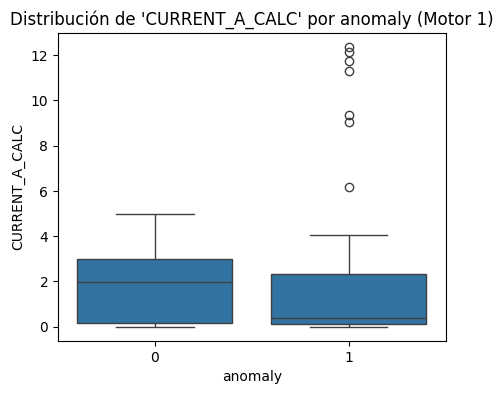

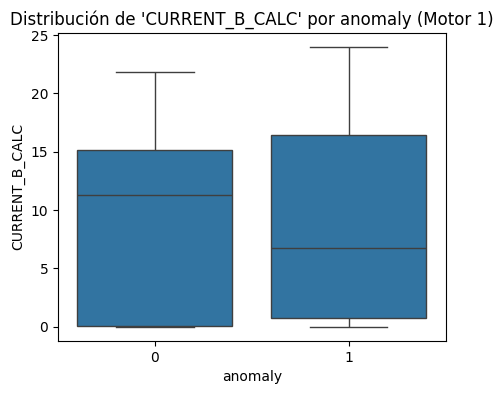

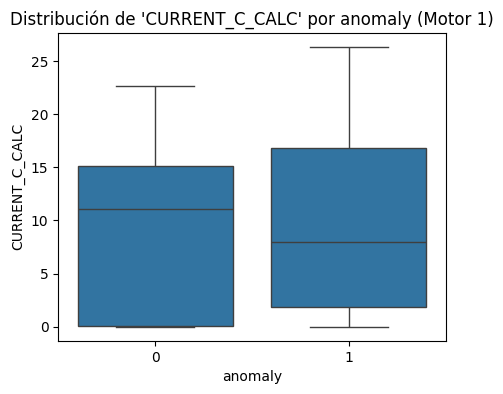

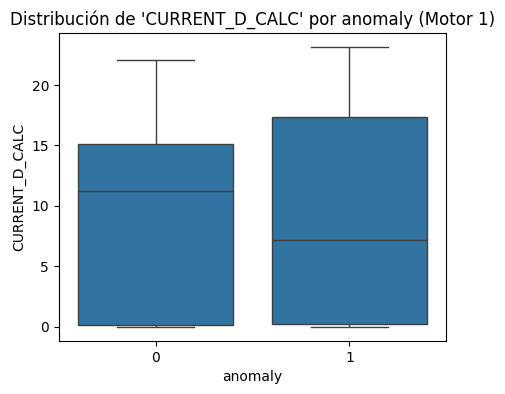

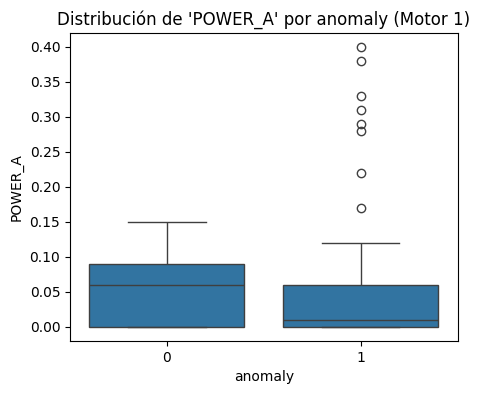

...

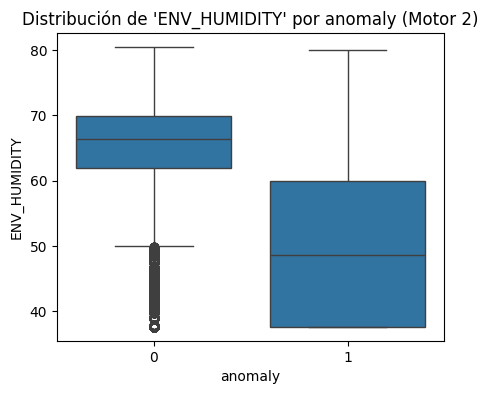

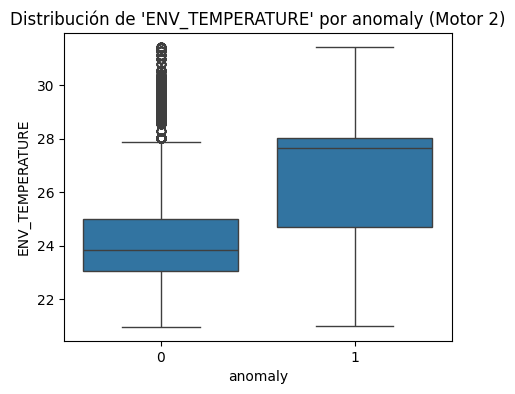

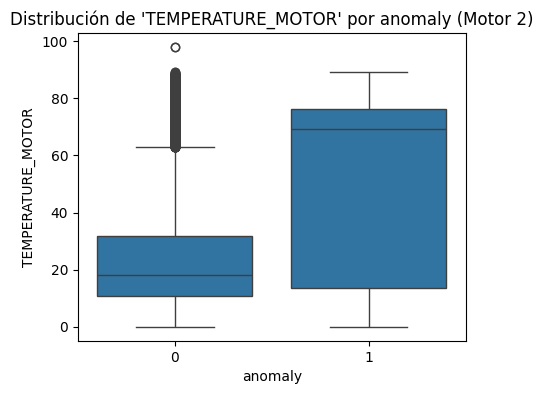

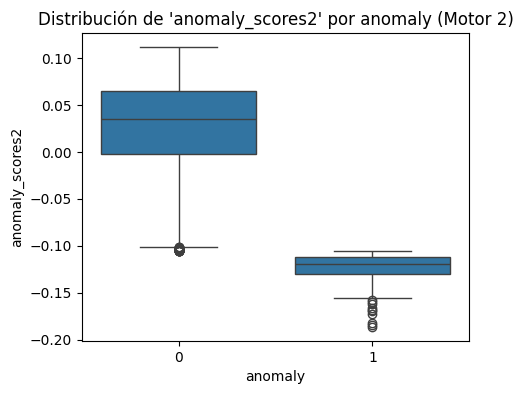

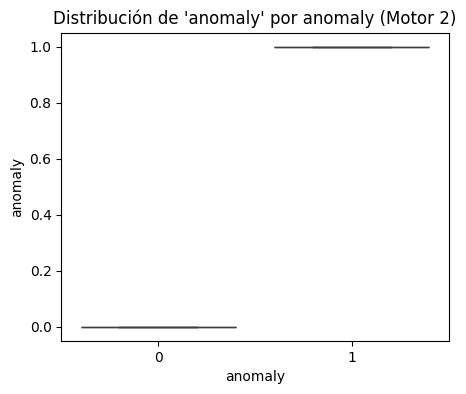

In [ ]:
# Boxplot para las variables del motor 1, comparando fallas y datos normales
for columna in fallas_motor1.columns:
  plt.figure(figsize=(5, 4))
  sns.boxplot(x="anomaly", y=columna, data=df_m1_variables)
  plt.title(f"Distribución de '{columna}' por anomaly (Motor 1)")
  plt.show()

# Boxplot para las variables del motor 2, comparando fallas y datos normales
for columna in fallas_motor2.columns:
  plt.figure(figsize=(5, 4))
  sns.boxplot(x="anomaly", y=columna, data=df_m2_variables)
  plt.title(f"Distribución de '{columna}' por anomaly (Motor 2)")
  plt.show()

###<font color="green">**Identificación de patrones y relaciones**</font>

**Matriz de correlación:**

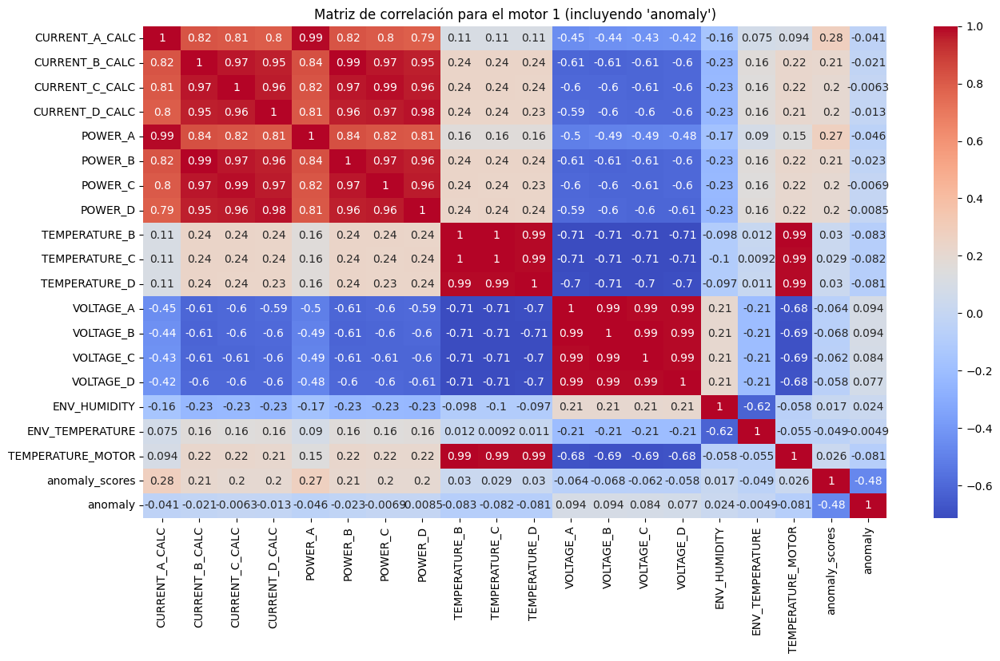

In [ ]:
# Matriz de correlación para el motor 1 (incluyendo 'anomaly')
correlaciones_motor1 = df_m1_variables.corr()  # Calcula la correlación con el DataFrame original
plt.figure(figsize=(15, 8))
sns.heatmap(correlaciones_motor1, annot=True, cmap="coolwarm")
plt.title("Matriz de correlación para el motor 1 (incluyendo 'anomaly')")
plt.show()

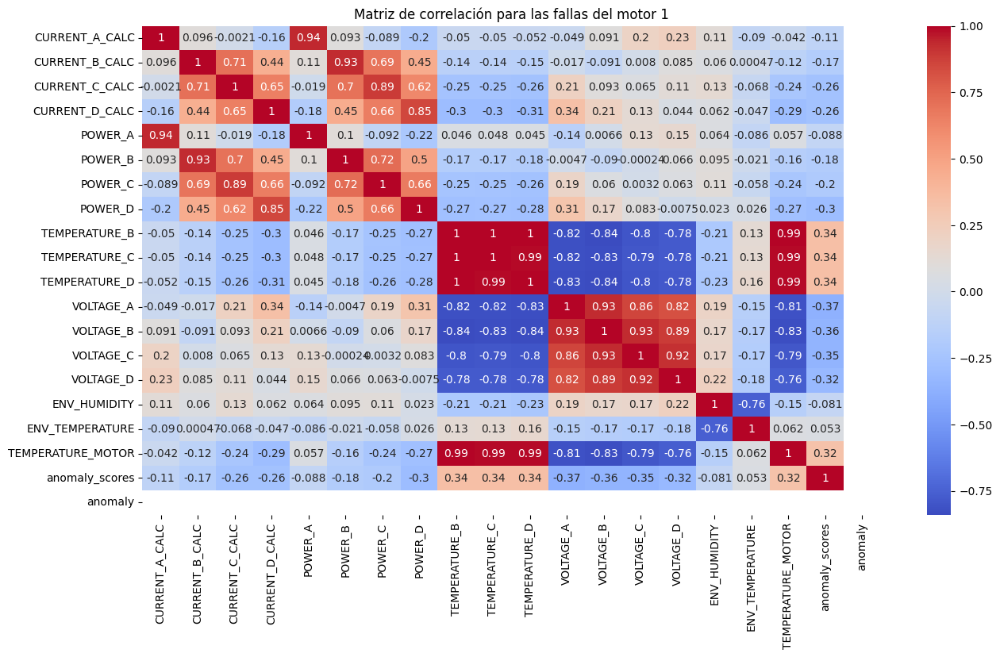

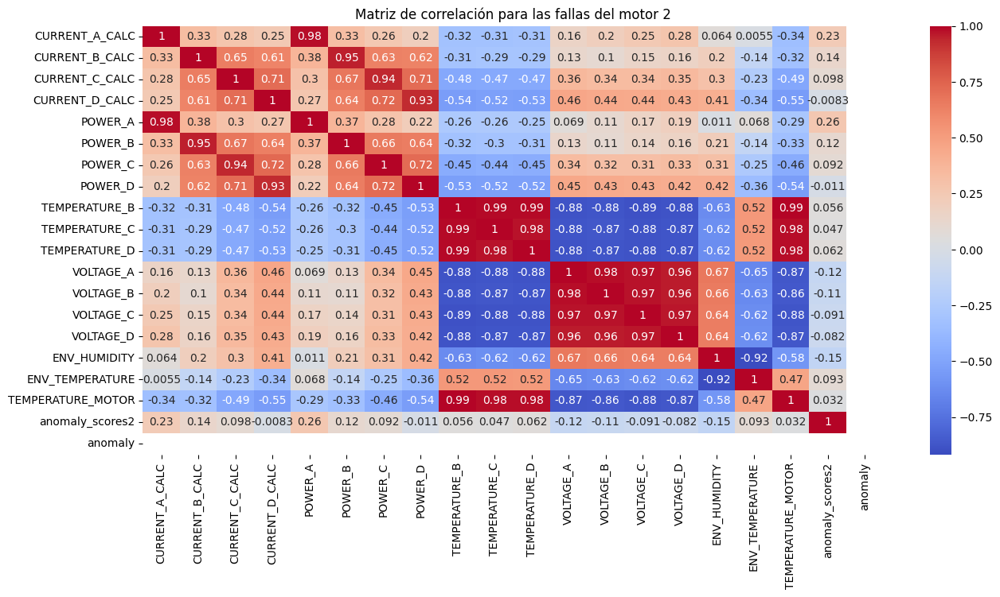

In [ ]:
# Matriz de correlación para las fallas del motor 1
correlaciones_fallas_motor1 = fallas_motor1.corr()
plt.figure(figsize=(15, 8))
sns.heatmap(correlaciones_fallas_motor1, annot=True, cmap="coolwarm")
plt.title("Matriz de correlación para las fallas del motor 1")
plt.show()

# Matriz de correlación para las fallas del motor 2
correlaciones_fallas_motor2 = fallas_motor2.corr()
plt.figure(figsize=(15, 7))
sns.heatmap(correlaciones_fallas_motor2, annot=True, cmap="coolwarm")
plt.title("Matriz de correlación para las fallas del motor 2")
plt.show()

### <font color="green">**Gráficos de dispersión:**  </font>

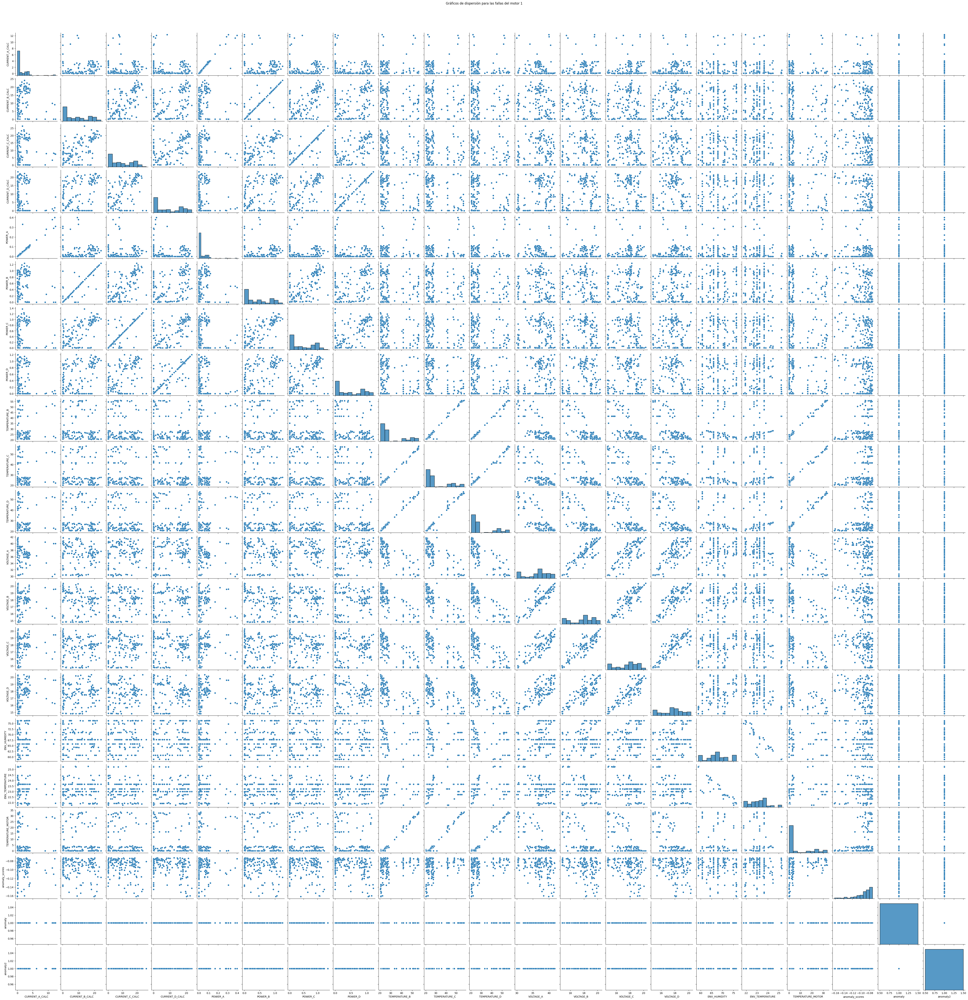

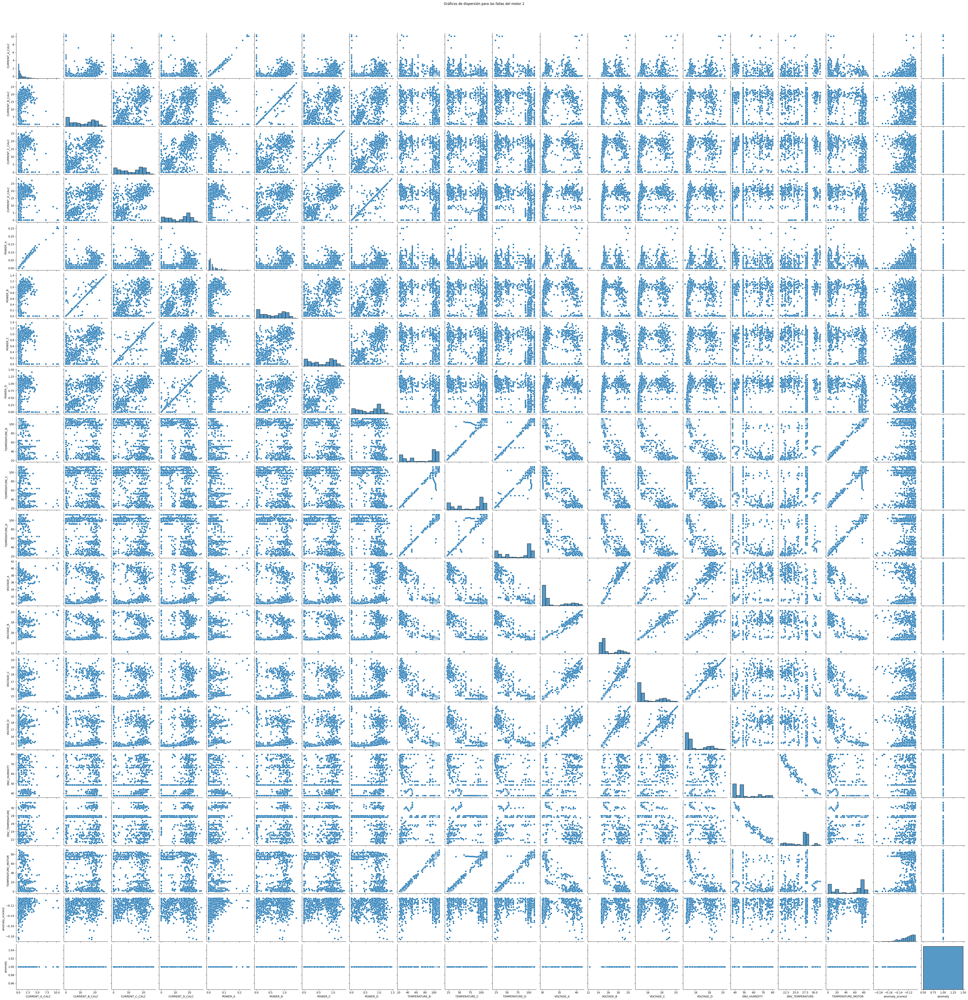

In [ ]:
# Gráficos de dispersión para pares de variables en las fallas del motor 1
sns.pairplot(fallas_motor1, vars=fallas_motor1.columns, kind="scatter")
plt.suptitle("Gráficos de dispersión para las fallas del motor 1", y=1.02)
plt.show()

# Gráficos de dispersión para pares de variables en las fallas del motor 2
sns.pairplot(fallas_motor2, vars=fallas_motor2.columns, kind="scatter")
plt.suptitle("Gráficos de dispersión para las fallas del motor 2", y=1.02)
plt.show()

### <font color="green">**Ajustamos Hiperparametros**  </font>

In [ ]:
# Cambiando max_samples = 256

anomaly_inputs_4 = ["CURRENT_A_CALC",  "CURRENT_B_CALC",  "CURRENT_C_CALC",  "CURRENT_D_CALC", "TEMPERATURE_MOTOR", "POWER_A",
                  "POWER_B", "POWER_C", "POWER_D", "VOLTAGE_A", "VOLTAGE_B", "VOLTAGE_C", "VOLTAGE_D", "ENV_TEMPERATURE", "ENV_HUMIDITY"]

# Motor 1
model_IF3 = IsolationForest(n_estimators=100, contamination="auto", max_samples=256, random_state=42)
model_IF3.fit(df_m1_para_hiperparametros[anomaly_inputs_4])
df_m1_para_hiperparametros['anomaly_scores3'] = model_IF3.decision_function(df_m1_para_hiperparametros[anomaly_inputs_4])
#df_m1_para_hiperparametros['anomaly'] = model_IF3.predict(df_m1_para_hiperparametros[anomaly_inputs2])

# Motor 2
model_IF4 = IsolationForest(n_estimators=100, contamination="auto", max_samples=256, random_state=42)
model_IF4.fit(df_m2_para_hiperparametros[anomaly_inputs_4])
df_m2_para_hiperparametros['anomaly_scores4'] = model_IF4.decision_function(df_m2_para_hiperparametros[anomaly_inputs_4])
#df_m2_para_hiperparametros['anomaly4'] = model_IF4.predict(df_m2_para_hiperparametros[anomaly_inputs2])


In [ ]:
print(df_m1_para_hiperparametros.describe())
print(df_m2_para_hiperparametros.describe())

       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count     7047.000000     7047.000000     7047.000000     7047.000000   
mean         1.787974        9.346260        9.354233        9.378201   
std          1.346043        6.654301        6.637763        6.622113   
min          0.000000        0.000000        0.000000        0.000000   
25%          0.180000        0.100000        0.100000        0.110000   
50%          1.970000       11.180000       11.070000       11.190000   
75%          2.960000       15.145000       15.138333       15.170000   
max         12.370000       23.990000       26.350000       23.170000   

           POWER_A      POWER_B      POWER_C      POWER_D  TEMPERATURE_B  \
count  7047.000000  7047.000000  7047.000000  7047.000000    7047.000000   
mean      0.052691     0.483096     0.484320     0.483604      36.732596   
std       0.041897     0.346871     0.345778     0.344829      11.766365   
min       0.000000     0.000000     0.

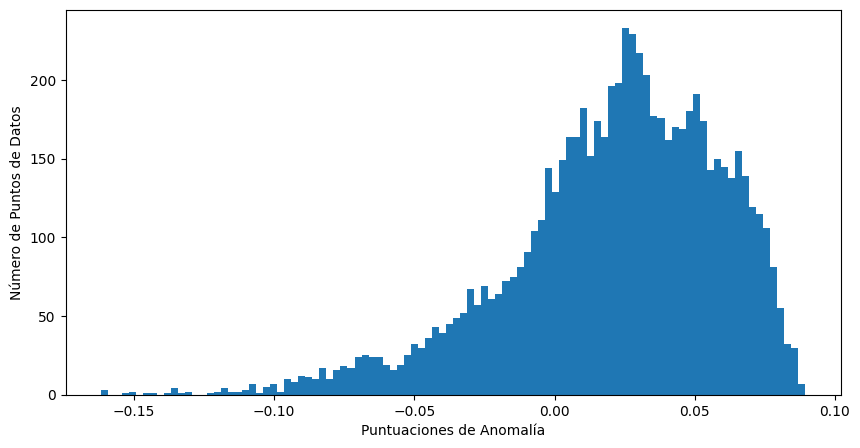

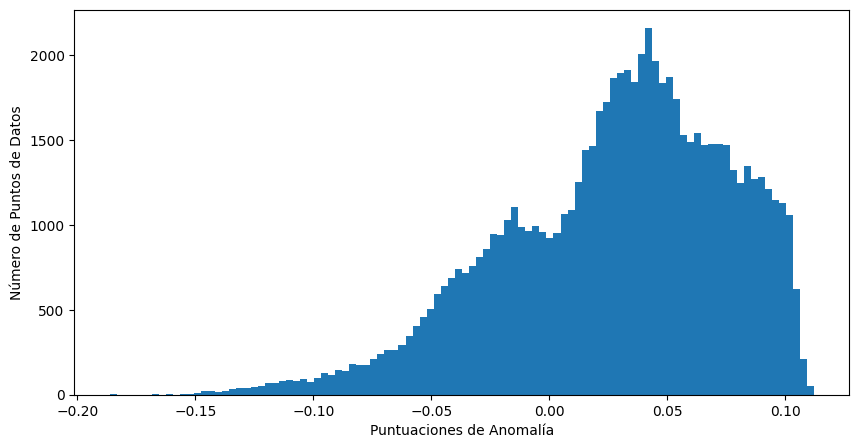

In [ ]:
plt.figure(figsize=(10, 5))
plt.hist(df_m1_para_hiperparametros.anomaly_scores3, bins=100)
plt.xlabel("Puntuaciones de Anomalía")
plt.ylabel("Número de Puntos de Datos")
plt.show()

plt.figure(figsize=(10, 5))
plt.hist(df_m2_para_hiperparametros.anomaly_scores4, bins=100)
plt.xlabel("Puntuaciones de Anomalía")
plt.ylabel("Número de Puntos de Datos")
plt.show()

In [ ]:
#M1
# Calculo del rango intercualtilico para anomaly_score
Q1 = df_m1_para_hiperparametros.anomaly_scores3.quantile(0.25)
Q3 = df_m1_para_hiperparametros.anomaly_scores3.quantile(0.75)
IQR = Q3 - Q1
# Calculamos el umbral de anomalia considerando datos atípicos
umbral_anomalia1 = Q1 - 1.5*IQR
umbral_anomalia1

#M2
# Calculo del rango intercualtilico para anomaly_score
Q1 = df_m2_para_hiperparametros.anomaly_scores4.quantile(0.25)
Q3 = df_m2_para_hiperparametros.anomaly_scores4.quantile(0.75)
IQR = Q3 - Q1
# Calculamos el umbral de anomalia considerando datos atípicos
umbral_anomalia2 = Q1 - 1.5*IQR
umbral_anomalia1, umbral_anomalia2

(-0.07237971414165405, -0.10535059621725922)

In [ ]:
#M1
# Definir el umbral para las anomalías
threshold = -0.07237971414165405
 #Buscar justificarlo

# Asignamos etiquetas: 1 para anomalía, 0 para normal
# Si la puntuación de anomalía es menor que el umbral, es una anomalía (etiqueta 1)
# Si la puntuación de anomalía es mayor o igual que el umbral, es normal (etiqueta 0)
labels = np.where(df_m1_para_hiperparametros.anomaly_scores3 < threshold, 1, 0)

#'labels' contiene las etiquetas para cada punto de datos en df
# 1 indica una anomalía, 0 indica un punto de datos normal

# Agregamos etiquetas al DataFrame:
df_m1_para_hiperparametros["anomaly"] = labels
#df["anomaly_label"] = labels
#df["anomaly_scores"] = anomaly_scores

#M2
# Definir el umbral para las anomalías
threshold = -0.10535059621725922
 #Buscar justificarlo

# Asignamos etiquetas: 1 para anomalía, 0 para normal
# Si la puntuación de anomalía es menor que el umbral, es una anomalía (etiqueta 1)
# Si la puntuación de anomalía es mayor o igual que el umbral, es normal (etiqueta 0)
labels = np.where(df_m2_para_hiperparametros.anomaly_scores4 < threshold, 1, 0)

#'labels' contiene las etiquetas para cada punto de datos en df
# 1 indica una anomalía, 0 indica un punto de datos normal

# Agregamos etiquetas al DataFrame:
df_m2_para_hiperparametros["anomaly"] = labels
#df["anomaly_label"] = labels
#df["anomaly_scores"] = anomaly_scores

##<font color="green">**Cálculo de percentiles**</font>

In [ ]:
#M1
# Calculamos los percentiles para saber donde se encuentra el umbral

percentiles = np.linspace(0, 1, 101)

# Calculamos los percentiles
percentiles_calculados = df_m1_para_hiperparametros.anomaly_scores3.quantile(percentiles)

# Muestra los resultados
print(percentiles_calculados.to_string())


0.00   -0.161778
0.01   -0.091273
0.02   -0.077012
0.03   -0.068423
0.04   -0.060641
0.05   -0.051348
0.06   -0.045779
0.07   -0.041320
0.08   -0.037088
0.09   -0.033492
0.10   -0.030425
0.11   -0.027709
0.12   -0.024647
0.13   -0.021796
0.14   -0.019238
0.15   -0.016664
0.16   -0.014403
0.17   -0.011945
0.18   -0.009856
0.19   -0.008119
0.20   -0.006258
0.21   -0.004808
0.22   -0.003203
0.23   -0.002074
0.24   -0.000711
0.25    0.000715
0.26    0.001945
0.27    0.003080
0.28    0.004345
0.29    0.005336
0.30    0.006498
0.31    0.007561
0.32    0.008591
0.33    0.009724
0.34    0.010653
0.35    0.011581
0.36    0.012643
0.37    0.013893
0.38    0.014903
0.39    0.015976
0.40    0.017065
0.41    0.018093
0.42    0.019162
0.43    0.020028
0.44    0.020884
0.45    0.021928
0.46    0.022842
0.47    0.023799
0.48    0.024559
0.49    0.025253
0.50    0.026032
0.51    0.026844
0.52    0.027510
0.53    0.028387
0.54    0.029068
0.55    0.029934
0.56    0.030663
0.57    0.031563
0.58    0.0323

In [ ]:
#M2
# Calculamos los percentiles para saber donde se encuentra el umbral

percentiles = np.linspace(0, 1, 101)

# Calculamos los percentiles
percentiles_calculados = df_m2_para_hiperparametros.anomaly_scores4.quantile(percentiles)

# Muestra los resultados
print(percentiles_calculados.to_string())

0.00   -0.186307
0.01   -0.104710
0.02   -0.086054
0.03   -0.073873
0.04   -0.065170
0.05   -0.058340
0.06   -0.053353
0.07   -0.048838
0.08   -0.045303
0.09   -0.042113
0.10   -0.038897
0.11   -0.036045
0.12   -0.033155
0.13   -0.030348
0.14   -0.027736
0.15   -0.025207
0.16   -0.022979
0.17   -0.020679
0.18   -0.018429
0.19   -0.016395
0.20   -0.014601
0.21   -0.012483
0.22   -0.010262
0.23   -0.008130
0.24   -0.005867
0.25   -0.003672
0.26   -0.001465
0.27    0.000880
0.28    0.003123
0.29    0.005288
0.30    0.007273
0.31    0.009304
0.32    0.011248
0.33    0.012981
0.34    0.014508
0.35    0.016014
0.36    0.017472
0.37    0.018904
0.38    0.020296
0.39    0.021646
0.40    0.022841
0.41    0.024059
0.42    0.025318
0.43    0.026490
0.44    0.027644
0.45    0.028790
0.46    0.029872
0.47    0.031094
0.48    0.032181
0.49    0.033327
0.50    0.034418
0.51    0.035532
0.52    0.036735
0.53    0.037864
0.54    0.038896
0.55    0.040012
0.56    0.041041
0.57    0.042053
0.58    0.0430

In [ ]:
df_m1_para_hiperparametros.anomaly.value_counts()

,count
anomaly,
0,6874
1,173


In [ ]:
df_m2_para_hiperparametros.anomaly.value_counts()

,count
anomaly,
0,71135
1,704


In [ ]:
falla = (173/len(df_m1_para_hiperparametros))*100
falla

2.4549453668227614

In [ ]:
falla = (704/len(df_m2_para_hiperparametros))*100
falla

0.9799690975653893

In [ ]:
# Análisis estadístico descriptivo de cada anomaly
for i in [0, 1]:  # Itera sobre las 2 anomaly: -1 y 1
    anomaly_data4 = df_m1_para_hiperparametros[df_m1_para_hiperparametros["anomaly"] == i]  # Filtramos los datos del anomaly i
    print(f"\nanomaly {i}:")
    print(anomaly_data4.describe())  # Muestra estadísticas


anomaly 0:
       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count     6874.000000     6874.000000     6874.000000     6874.000000   
mean         1.796657        9.368460        9.360896        9.391951   
std          1.314411        6.630093        6.613286        6.584762   
min          0.000000        0.000000        0.000000        0.000000   
25%          0.180000        0.100000        0.100000        0.110000   
50%          1.990000       11.260000       11.120000       11.260000   
75%          2.970000       15.140000       15.127500       15.150000   
max          5.000000       21.850000       22.630000       22.100000   

           POWER_A      POWER_B      POWER_C      POWER_D  TEMPERATURE_B  \
count  6874.000000  6874.000000  6874.000000  6874.000000    6874.000000   
mean      0.052994     0.484361     0.484700     0.484070      36.887450   
std       0.040973     0.345633     0.343966     0.342996      11.733147   
min       0.000000     0.0

In [ ]:
# Análisis estadístico descriptivo de cada anomaly
for i in [0, 1]:  # Itera sobre las 2 anomaly: 0 y 1
    anomaly_data5 = df_m2_para_hiperparametros[df_m2_para_hiperparametros["anomaly"] == i]  # Filtramos los datos del anomaly i
    print(f"\nanomaly {i}:")
    print(anomaly_data5.describe())  # Muestra estadísticas


anomaly 0:
       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count    71135.000000    71135.000000    71135.000000    71135.000000   
mean         1.583590        7.621059        7.616714        7.616484   
std          1.130453        5.380289        5.367532        5.362425   
min          0.000000        0.000000        0.000000        0.000000   
25%          0.420000        2.250000        2.270000        2.270000   
50%          1.680000        8.010000        8.020000        8.020000   
75%          2.360000       11.050000       11.010000       11.010000   
max         11.660000       26.790000       34.100000       25.640000   

            POWER_A       POWER_B       POWER_C       POWER_D  TEMPERATURE_B  \
count  71135.000000  71135.000000  71135.000000  71135.000000   71135.000000   
mean       0.045468      0.394357      0.394019      0.394322      47.039027   
std        0.034179      0.280662      0.279423      0.279419      17.697476   
min       

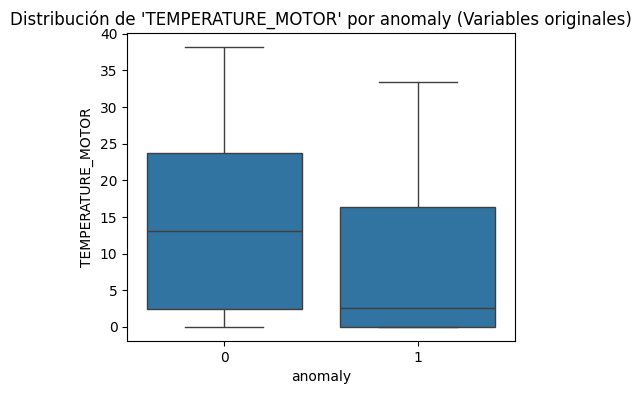

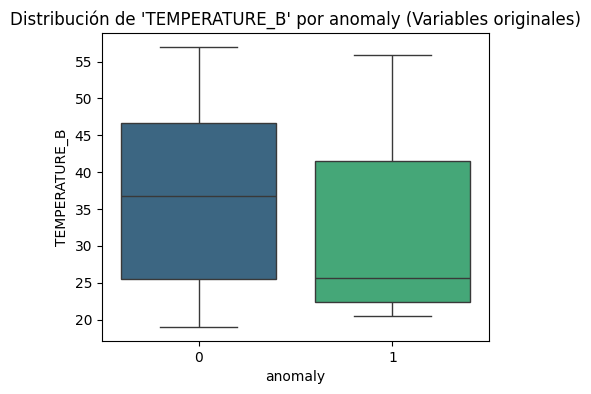

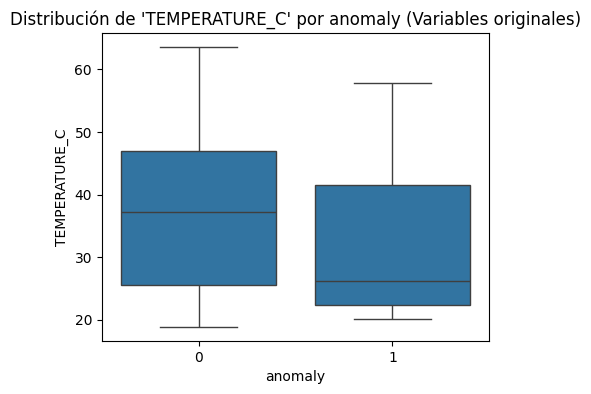

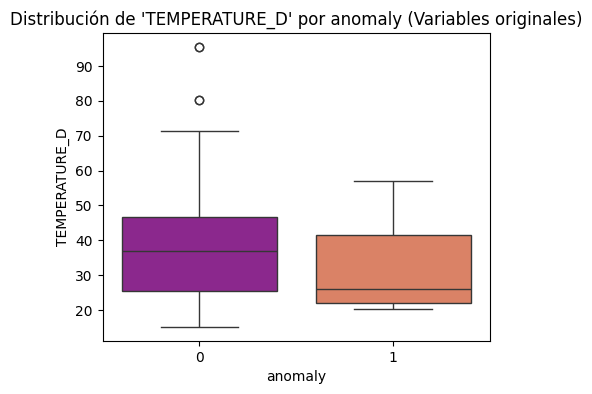

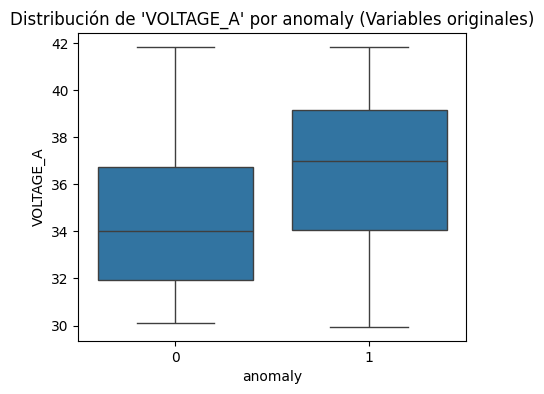

...

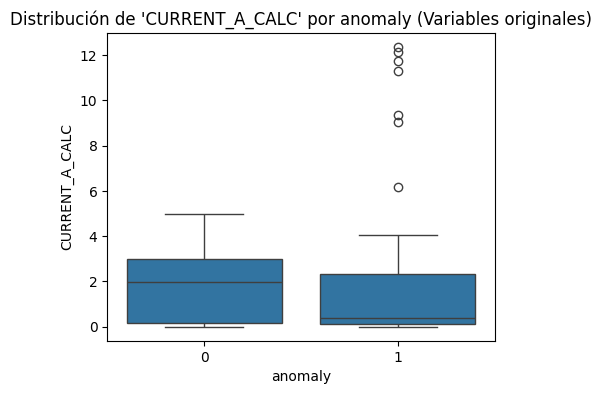

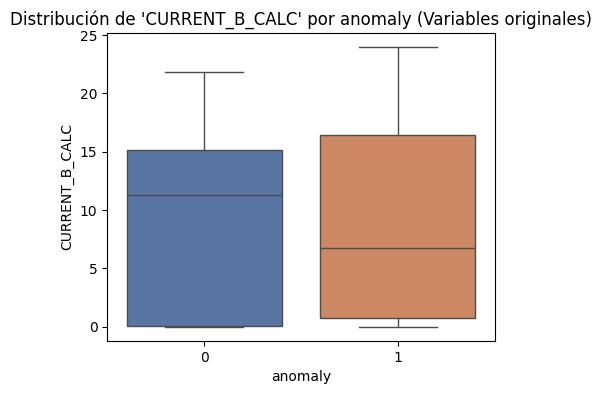

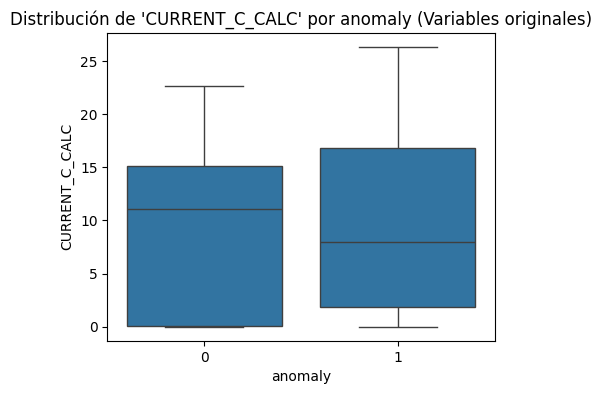

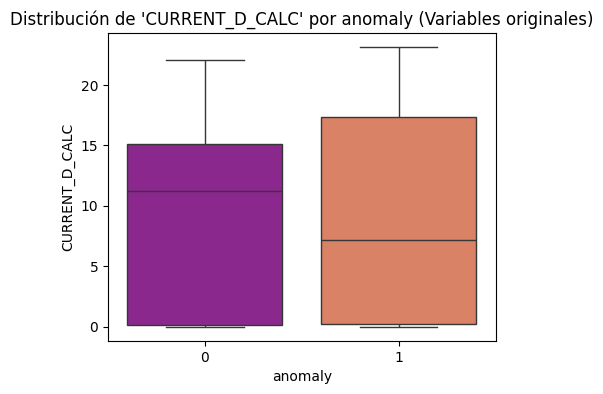

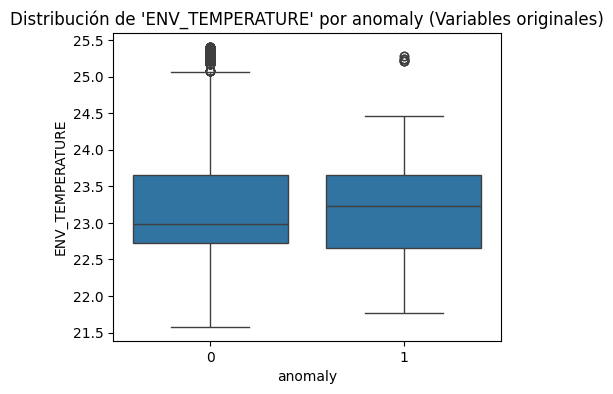

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.10/dist-packages/matplotlib/pyplot.py'>

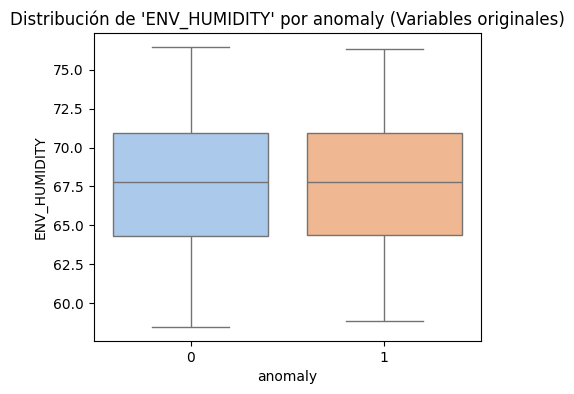

In [ ]:
# Boxplot para las variables
#temperaturas
plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_MOTOR", data=df_m1_para_hiperparametros)
plt.title("Distribución de 'TEMPERATURE_MOTOR' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_B", data=df_m1_para_hiperparametros, palette="viridis")
plt.title("Distribución de 'TEMPERATURE_B' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_C", data=df_m1_para_hiperparametros)
plt.title("Distribución de 'TEMPERATURE_C' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_D", data=df_m1_para_hiperparametros, palette="plasma")
plt.title("Distribución de 'TEMPERATURE_D' por anomaly (Variables originales)")
plt.show()

# Voltajes

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_A", data=df_m1_para_hiperparametros)
plt.title("Distribución de 'VOLTAGE_A' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_B", data=df_m1_para_hiperparametros, palette="deep")
plt.title("Distribución de 'VOLTAGE_B' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_C", data=df_m1_para_hiperparametros, palette="viridis")
plt.title("Distribución de 'VOLTAGE_C' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_D", data=df_m1_para_hiperparametros)
plt.title("Distribución de 'VOLTAGE_D' por anomaly (Variables originales)")
plt.show()

#Potencias

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_A", data=df_m1_para_hiperparametros, palette="plasma")
plt.title("Distribución de 'POWER_A' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_B", data=df_m1_para_hiperparametros, palette="viridis")
plt.title("Distribución de 'POWER_B' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_C", data=df_m1_para_hiperparametros)
plt.title("Distribución de 'POWER_C' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_D", data=df_m1_para_hiperparametros, palette="pastel")
plt.title("Distribución de 'POWER_D' por anomaly (Variables originales)")
plt.show()

#Corrientes

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_A_CALC", data=df_m1_para_hiperparametros)
plt.title("Distribución de 'CURRENT_A_CALC' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_B_CALC", data=df_m1_para_hiperparametros, palette="deep")
plt.title("Distribución de 'CURRENT_B_CALC' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_C_CALC", data=df_m1_para_hiperparametros)
plt.title("Distribución de 'CURRENT_C_CALC' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_D_CALC", data=df_m1_para_hiperparametros, palette="plasma")
plt.title("Distribución de 'CURRENT_D_CALC' por anomaly (Variables originales)")
plt

#Condiciones ambientes

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="ENV_TEMPERATURE", data=df_m1_para_hiperparametros)
plt.title("Distribución de 'ENV_TEMPERATURE' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="ENV_HUMIDITY", data=df_m1_para_hiperparametros, palette="pastel")
plt.title("Distribución de 'ENV_HUMIDITY' por anomaly (Variables originales)")
plt

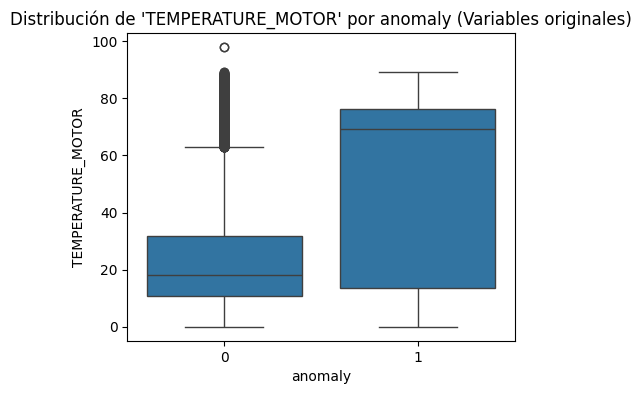

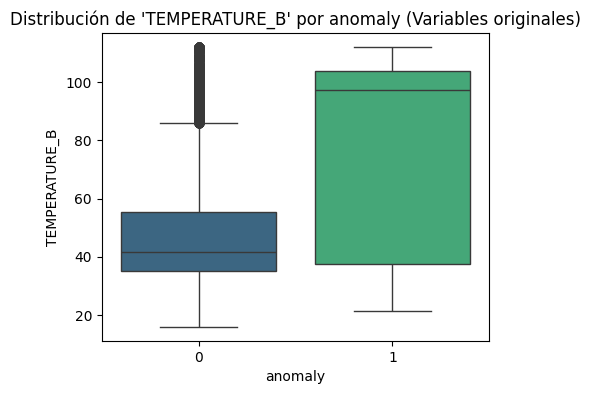

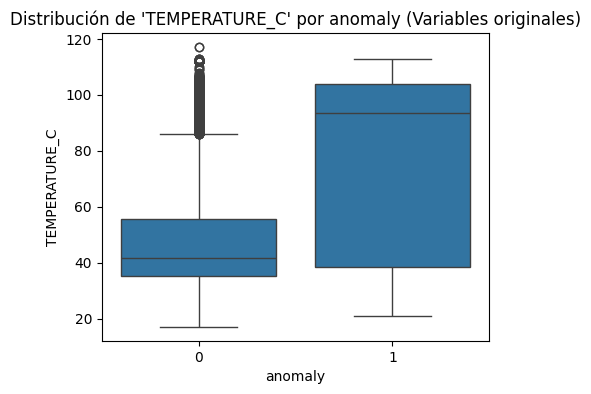

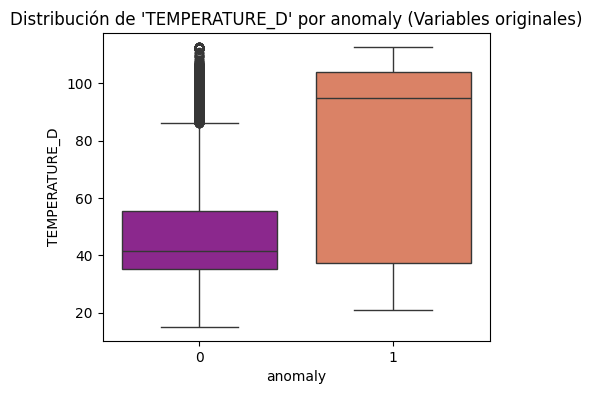

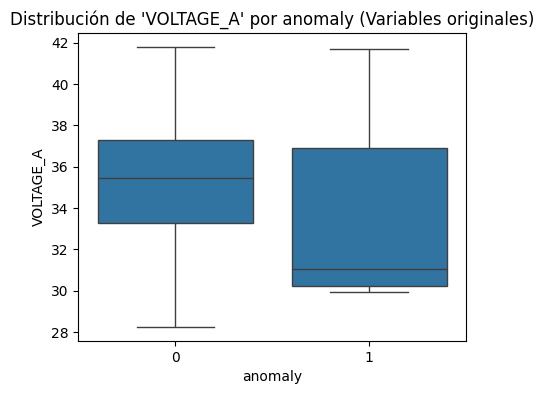

...

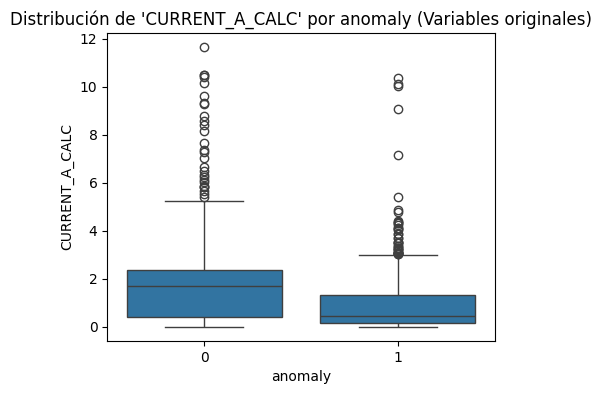

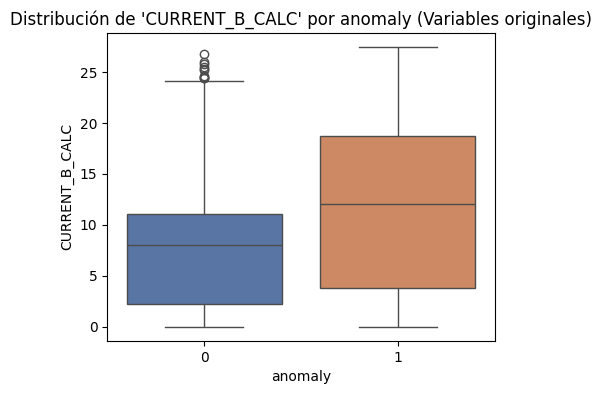

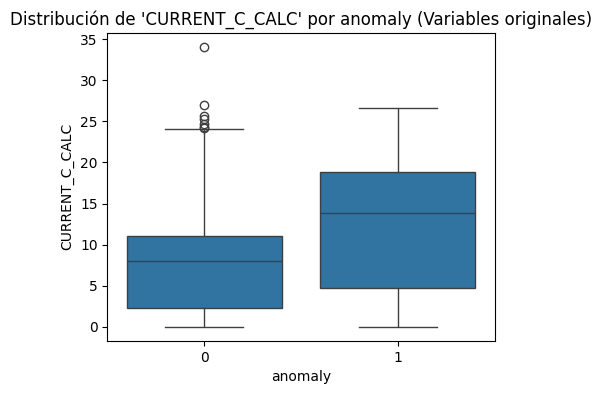

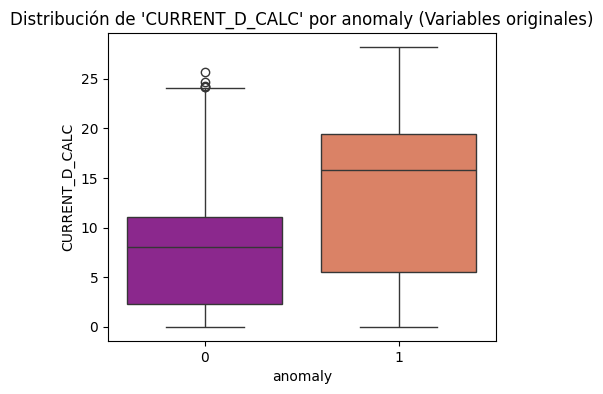

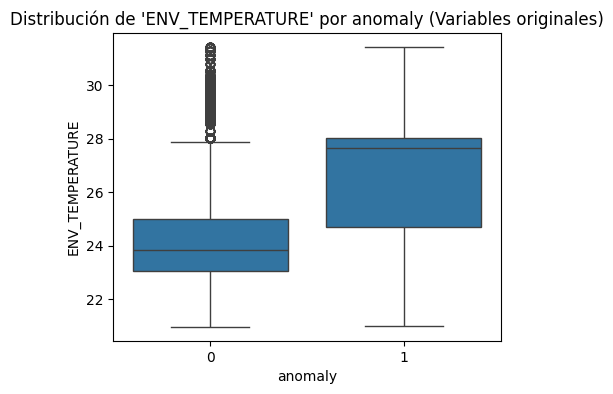

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.10/dist-packages/matplotlib/pyplot.py'>

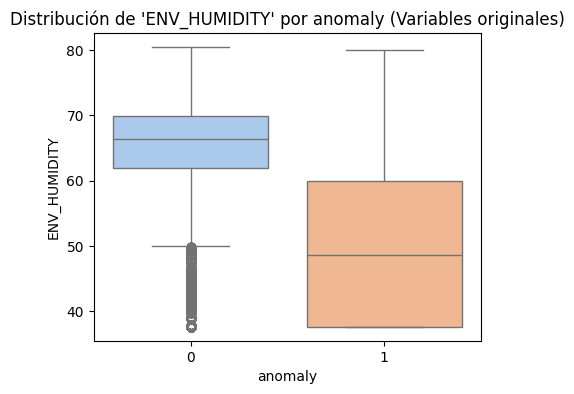

In [ ]:
# Boxplot para las variables
#temperaturas
plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_MOTOR", data=df_m2_para_hiperparametros)
plt.title("Distribución de 'TEMPERATURE_MOTOR' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_B", data=df_m2_para_hiperparametros, palette="viridis")
plt.title("Distribución de 'TEMPERATURE_B' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_C", data=df_m2_para_hiperparametros)
plt.title("Distribución de 'TEMPERATURE_C' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="TEMPERATURE_D", data=df_m2_para_hiperparametros, palette="plasma")
plt.title("Distribución de 'TEMPERATURE_D' por anomaly (Variables originales)")
plt.show()

# Voltajes

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_A", data=df_m2_para_hiperparametros)
plt.title("Distribución de 'VOLTAGE_A' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_B", data=df_m2_para_hiperparametros, palette="deep")
plt.title("Distribución de 'VOLTAGE_B' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_C", data=df_m2_para_hiperparametros, palette="viridis")
plt.title("Distribución de 'VOLTAGE_C' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="VOLTAGE_D", data=df_m2_para_hiperparametros)
plt.title("Distribución de 'VOLTAGE_D' por anomaly (Variables originales)")
plt.show()

#Potencias

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_A", data=df_m2_para_hiperparametros, palette="plasma")
plt.title("Distribución de 'POWER_A' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_B", data=df_m2_para_hiperparametros, palette="viridis")
plt.title("Distribución de 'POWER_B' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_C", data=df_m2_para_hiperparametros)
plt.title("Distribución de 'POWER_C' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="POWER_D", data=df_m2_para_hiperparametros, palette="pastel")
plt.title("Distribución de 'POWER_D' por anomaly (Variables originales)")
plt.show()

#Corrientes

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_A_CALC", data=df_m2_para_hiperparametros)
plt.title("Distribución de 'CURRENT_A_CALC' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_B_CALC", data=df_m2_para_hiperparametros, palette="deep")
plt.title("Distribución de 'CURRENT_B_CALC' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_C_CALC", data=df_m2_para_hiperparametros)
plt.title("Distribución de 'CURRENT_C_CALC' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="CURRENT_D_CALC", data=df_m2_para_hiperparametros, palette="plasma")
plt.title("Distribución de 'CURRENT_D_CALC' por anomaly (Variables originales)")
plt

#Condiciones ambientes

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="ENV_TEMPERATURE", data=df_m2_para_hiperparametros)
plt.title("Distribución de 'ENV_TEMPERATURE' por anomaly (Variables originales)")
plt.show()

plt.figure(figsize=(5, 4))
sns.boxplot(x="anomaly", y="ENV_HUMIDITY", data=df_m2_para_hiperparametros, palette="pastel")
plt.title("Distribución de 'ENV_HUMIDITY' por anomaly (Variables originales)")
plt

In [ ]:
# Matriz de correlaciones
# Análisis de correlaciones
correlaciones_motor1_hiper = df_m1_para_hiperparametros.corr()
print(correlaciones_motor1_hiper)

                   CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  \
CURRENT_A_CALC           1.000000        0.822051        0.811028   
CURRENT_B_CALC           0.822051        1.000000        0.971197   
CURRENT_C_CALC           0.811028        0.971197        1.000000   
CURRENT_D_CALC           0.795840        0.954835        0.964377   
POWER_A                  0.989546        0.837020        0.824716   
POWER_B                  0.822195        0.994525        0.970950   
POWER_C                  0.804351        0.968955        0.986338   
POWER_D                  0.792589        0.953792        0.960142   
TEMPERATURE_B            0.108812        0.242940        0.240444   
TEMPERATURE_C            0.109524        0.243094        0.240624   
TEMPERATURE_D            0.108315        0.239886        0.237398   
VOLTAGE_A               -0.445274       -0.609862       -0.598988   
VOLTAGE_B               -0.435293       -0.613645       -0.604307   
VOLTAGE_C               -0.427049 

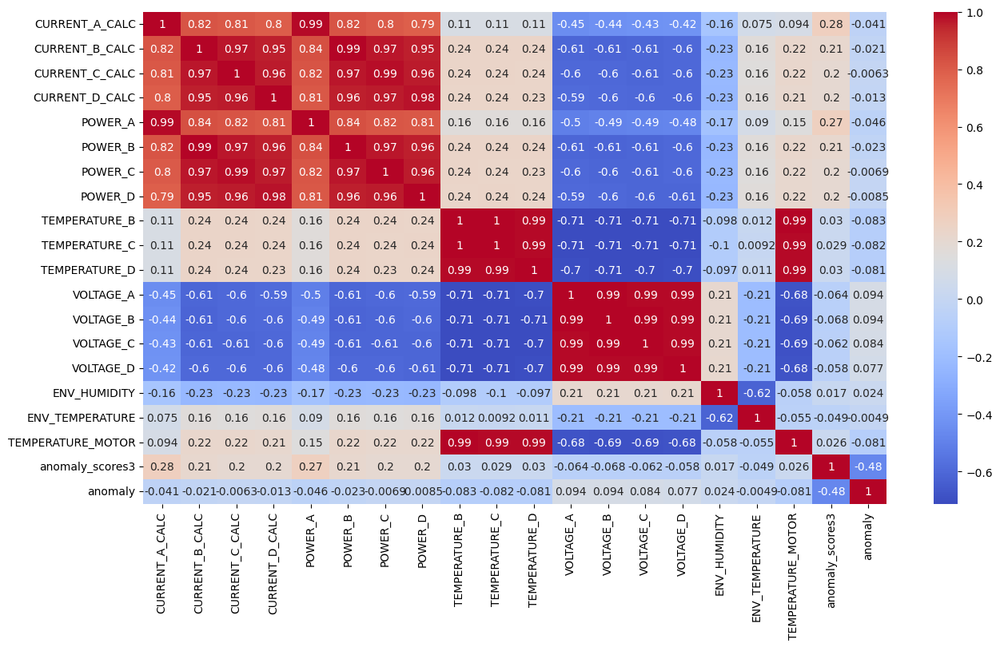

In [ ]:
#Graficamos Matriz de correlaciones
plt.figure(figsize = (15, 8))
sns.heatmap(correlaciones_motor1_hiper, annot = True, cmap = "coolwarm") # heatmap: crea un mapa de calor apartir de la matriz de correlaciones
plt.show()

In [ ]:
# Matriz de correlaciones
# Análisis de correlaciones
correlaciones_motor2_hiper = df_m2_para_hiperparametros.corr()
print(correlaciones_motor2_hiper)

                   CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  \
CURRENT_A_CALC           1.000000        0.778983        0.764124   
CURRENT_B_CALC           0.778983        1.000000        0.954067   
CURRENT_C_CALC           0.764124        0.954067        1.000000   
CURRENT_D_CALC           0.746925        0.939694        0.951770   
POWER_A                  0.990784        0.802656        0.787894   
POWER_B                  0.780048        0.990535        0.956148   
POWER_C                  0.764532        0.952582        0.983714   
POWER_D                  0.745878        0.940205        0.950820   
TEMPERATURE_B            0.002127        0.251776        0.251491   
TEMPERATURE_C            0.004328        0.253727        0.253280   
TEMPERATURE_D            0.003960        0.253488        0.253012   
VOLTAGE_A               -0.376303       -0.587090       -0.578270   
VOLTAGE_B               -0.368077       -0.591000       -0.584062   
VOLTAGE_C               -0.361325 

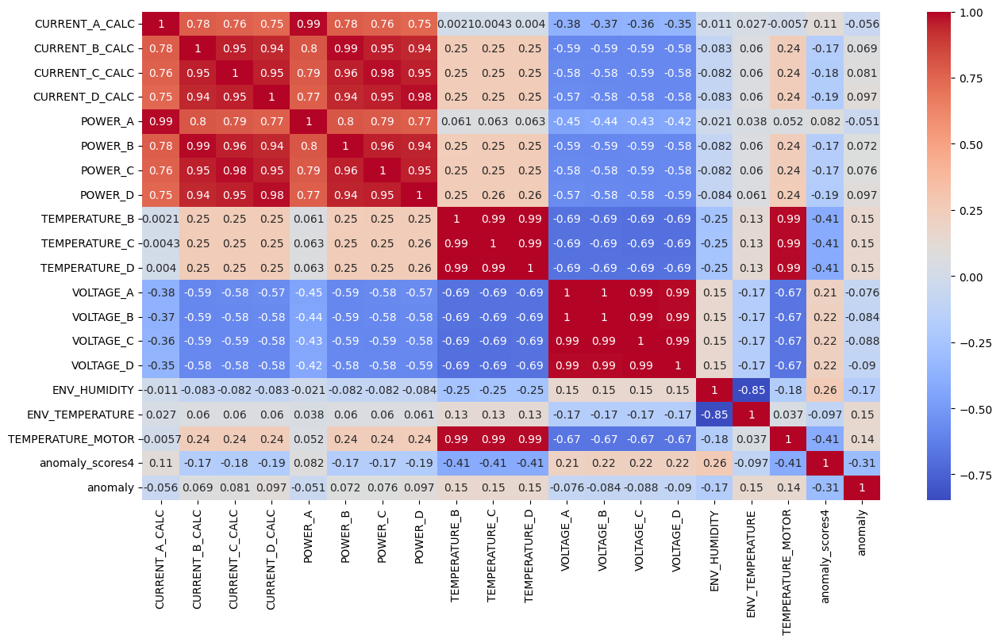

In [ ]:
#Graficamos Matriz de correlaciones
plt.figure(figsize = (15, 8))
sns.heatmap(correlaciones_motor2_hiper, annot = True, cmap = "coolwarm") # heatmap: crea un mapa de calor apartir de la matriz de correlaciones
plt.show()

##<font color="green">**Con todos los datos**</font>

In [ ]:
anomaly_inputs5 = ["CURRENT_A_CALC",  "CURRENT_B_CALC",  "CURRENT_C_CALC",  "CURRENT_D_CALC", "TEMPERATURE_MOTOR", "POWER_A",
                  "POWER_B", "POWER_C", "POWER_D", "VOLTAGE_A", "VOLTAGE_B", "VOLTAGE_C", "VOLTAGE_D", "ENV_TEMPERATURE", "ENV_HUMIDITY"]
model_IF2 = IsolationForest(n_estimators=100, contamination="auto", max_samples="auto", random_state=42) # consideran
model_IF2.fit(df_completo[anomaly_inputs5])
df_completo['anomaly_scores'] = model_IF2.decision_function(df_completo[anomaly_inputs5])
#df_m1_variables['anomaly'] = model_IF2.predict(df_m1_variables[anomaly_inputs2])
df_completo

,CURRENT_A_CALC,CURRENT_B_CALC,CURRENT_C_CALC,CURRENT_D_CALC,POWER_A,POWER_B,POWER_C,POWER_D,TEMPERATURE_B,TEMPERATURE_C,TEMPERATURE_D,VOLTAGE_A,VOLTAGE_B,VOLTAGE_C,VOLTAGE_D,ENV_HUMIDITY,ENV_TEMPERATURE,TEMPERATURE_MOTOR,anomaly_scores
prueba,,,,,,,,,,,,,,,,,,,
1,0.15,0.08,0.080,0.090,0.00,0.00,0.00,0.00,20.63,20.85,20.850,41.64,20.31,20.210,20.31,70.56,23.11,0.00,0.004880
2,0.14,0.08,0.090,0.070,0.00,0.00,0.00,0.00,20.63,20.63,20.630,41.64,20.31,20.210,20.31,70.56,23.11,0.00,0.003576
3,0.15,0.09,0.070,0.060,0.00,0.00,0.00,0.00,20.63,20.63,20.630,41.64,20.31,20.210,20.31,70.56,23.11,0.00,0.000643
3,0.19,0.08,0.090,0.100,0.00,0.00,0.00,0.01,20.63,20.54,20.540,41.62,20.30,20.210,20.30,70.56,23.11,0.00,-0.007939
5,0.16,0.07,0.070,0.070,0.00,0.00,0.00,0.00,20.63,20.54,20.540,41.62,20.30,20.210,20.30,70.56,23.11,0.00,0.003609
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78882,0.42,11.29,8.460,7.110,0.01,0.58,0.44,0.37,54.58,54.58,54.210,30.39,14.82,14.765,14.83,70.92,22.72,31.21,-0.010818
78883,0.41,6.44,2.220,8.035,0.01,0.33,0.12,0.15,54.58,54.58,54.115,30.39,14.79,14.760,14.83,70.92,22.72,31.21,-0.038765
78884,0.18,7.18,7.020,8.960,0.01,0.37,0.36,0.46,54.58,54.58,54.020,30.38,14.81,14.750,14.82,70.92,22.72,31.21,-0.010087


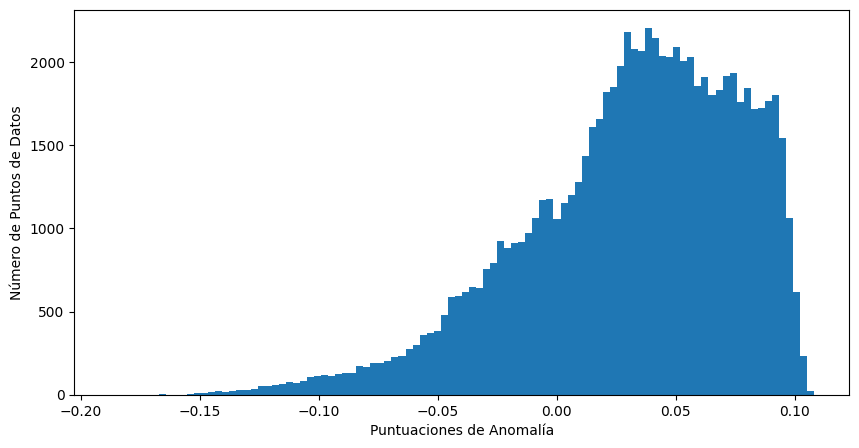

In [ ]:
plt.figure(figsize=(10, 5))
plt.hist(df_completo.anomaly_scores, bins=100)
plt.xlabel("Puntuaciones de Anomalía")
plt.ylabel("Número de Puntos de Datos")
plt.show()

In [ ]:
# Análisis Descriptivo
print(df_completo.describe())

       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count    78886.000000    78886.000000    78886.000000    78886.000000   
mean         1.596111        7.809064        7.811574        7.821440   
std          1.155227        5.565275        5.553337        5.555169   
min          0.000000        0.000000        0.000000        0.000000   
25%          0.400000        2.180000        2.216250        2.230000   
50%          1.680000        8.110000        8.120000        8.110000   
75%          2.410000       11.840000       11.800000       11.810000   
max         12.370000       27.480000       34.100000       28.220000   

            POWER_A       POWER_B       POWER_C       POWER_D  TEMPERATURE_B  \
count  78886.000000  78886.000000  78886.000000  78886.000000   78886.000000   
mean       0.045954      0.404122      0.404036      0.404786      46.369449   
std        0.035039      0.290304      0.289068      0.289376      17.908512   
min        0.000000   

In [ ]:
# Calculo del rango intercualtilico para anomaly_score
Q1 = df_completo.anomaly_scores.quantile(0.25)
Q3 = df_completo.anomaly_scores.quantile(0.75)
IQR = Q3 - Q1
# Calculamos el umbral de anomalia considerando datos atípicos
umbral_anomalia = Q1 - 1.5*IQR
umbral_anomalia

-0.08973441444685075

In [ ]:
# Definir el umbral para las anomalías
threshold = -0.08973441444685075
 #Buscando justificación

# Asignamos etiquetas: 1 para anomalía, 0 para normal
# Si la puntuación de anomalía es menor que el umbral, es una anomalía (etiqueta 1)
# Si la puntuación de anomalía es mayor o igual que el umbral, es normal (etiqueta 0)
labels = np.where(df_completo.anomaly_scores < threshold, 1, 0)

#'labels' contiene las etiquetas para cada punto de datos en df
# 1 indica una anomalía, 0 indica un punto de datos normal

# Agregamos etiquetas al DataFrame:
df_completo["anomaly"] = labels
#df["anomaly_label"] = labels
#df["anomaly_scores"] = anomaly_scores

##<font color="green">**Cálculo de percentiles**</font>

In [ ]:
# Calculamos los percentiles para saber donde se encuentra el umbral

percentiles = np.linspace(0, 1, 101)

# Calculamos los percentiles
percentiles_calculados = df_completo.anomaly_scores.quantile(percentiles)

# Muestra los resultados
print(percentiles_calculados.to_string())

0.00   -0.187783
0.01   -0.101357
0.02   -0.082915
0.03   -0.070211
0.04   -0.060512
0.05   -0.053570
0.06   -0.047560
0.07   -0.043336
0.08   -0.039392
0.09   -0.035621
0.10   -0.032044
0.11   -0.028744
0.12   -0.025685
0.13   -0.023156
0.14   -0.020489
0.15   -0.017978
0.16   -0.015329
0.17   -0.012783
0.18   -0.010393
0.19   -0.008193
0.20   -0.006017
0.21   -0.004115
0.22   -0.002142
0.23   -0.000032
0.24    0.002188
0.25    0.004197
0.26    0.006123
0.27    0.008111
0.28    0.009969
0.29    0.011654
0.30    0.013239
0.31    0.014619
0.32    0.016110
0.33    0.017599
0.34    0.018969
0.35    0.020332
0.36    0.021634
0.37    0.022868
0.38    0.024130
0.39    0.025390
0.40    0.026585
0.41    0.027725
0.42    0.028900
0.43    0.029945
0.44    0.031009
0.45    0.032167
0.46    0.033229
0.47    0.034384
0.48    0.035484
0.49    0.036635
0.50    0.037752
0.51    0.038814
0.52    0.039858
0.53    0.040901
0.54    0.042037
0.55    0.043100
0.56    0.044248
0.57    0.045422
0.58    0.0464

In [ ]:
# Análisis estadístico descriptivo de cada anomaly
for i in [0, 1]:  # Itera sobre las 2 anomaly: 0 y 1
    anomaly_data2 = df_completo[df_completo["anomaly"] == i]  # Filtra los datos del anomaly i
    print(f"\nanomaly {i}:")
    print(anomaly_data2.describe())  # Muestra estadísticas


anomaly 0:
       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count    77626.000000    77626.000000    77626.000000    77626.000000   
mean         1.601274        7.735469        7.732270        7.737600   
std          1.148656        5.493961        5.479234        5.472096   
min          0.000000        0.000000        0.000000        0.000000   
25%          0.410000        2.140000        2.170000        2.190000   
50%          1.690000        8.090000        8.091667        8.090000   
75%          2.420000       11.670000       11.649167       11.630000   
max         12.150000       26.790000       34.100000       25.640000   

            POWER_A       POWER_B       POWER_C       POWER_D  TEMPERATURE_B  \
count  77626.000000  77626.000000  77626.000000  77626.000000   77626.000000   
mean       0.046102      0.400228      0.400039      0.400345      46.030154   
std        0.034929      0.286525      0.285275      0.285028      17.362492   
min       

In [ ]:
df_completo.anomaly.value_counts()

,count
anomaly,
0,77626
1,1260


In [ ]:
falla = (1260/len(df_completo))*100
falla

1.597241589128616

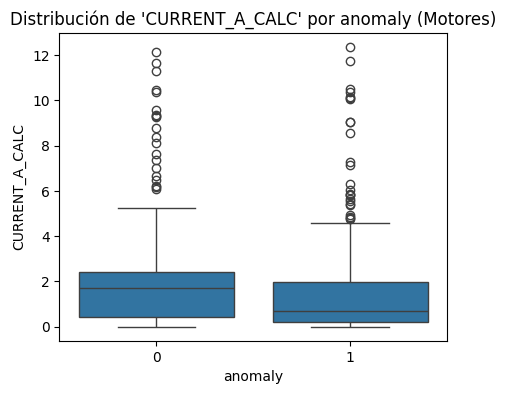

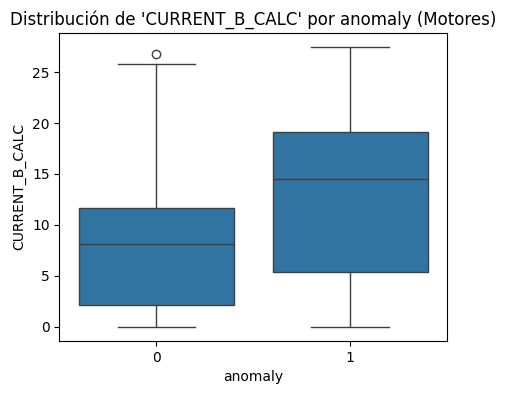

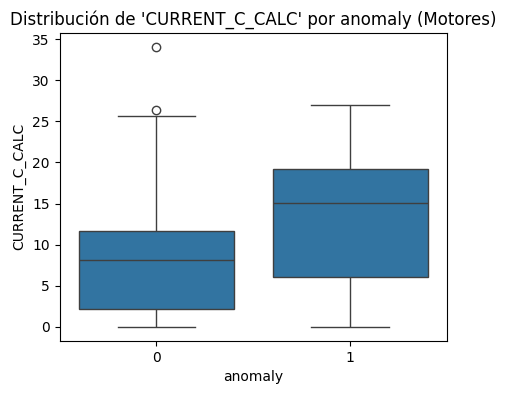

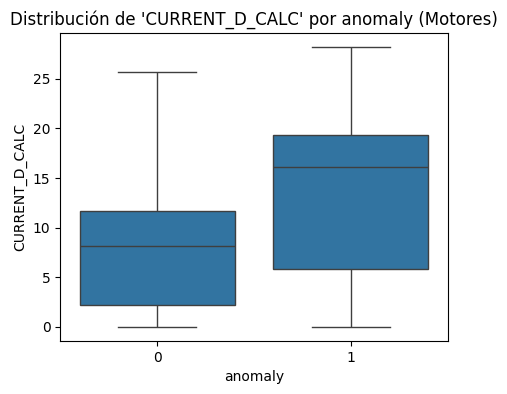

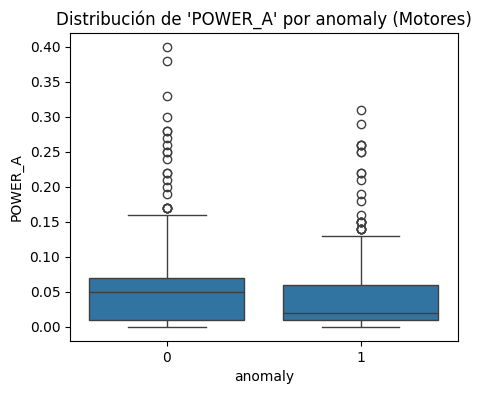

...

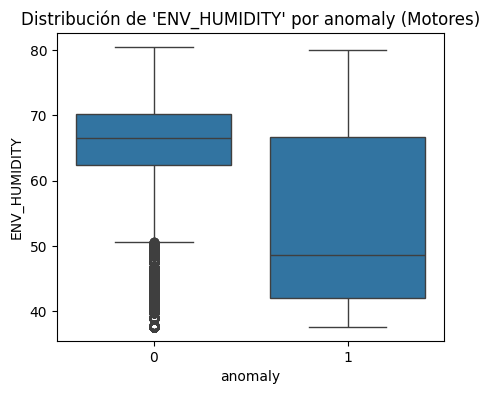

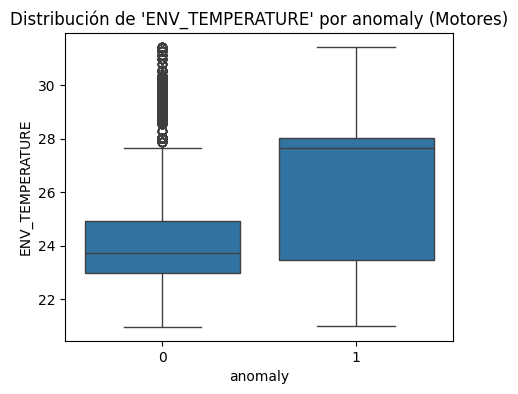

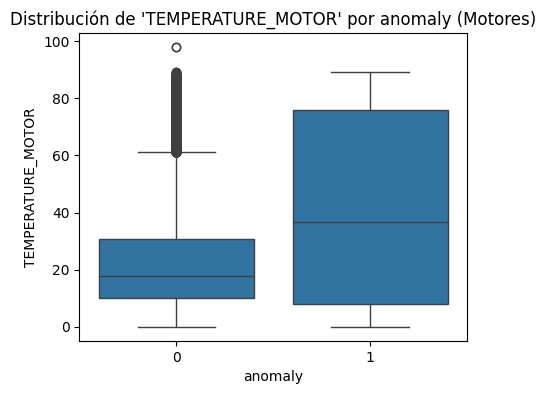

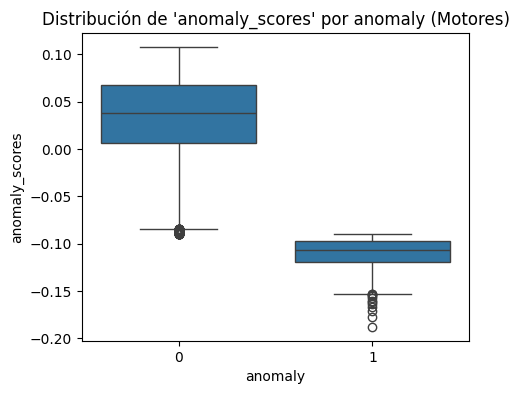

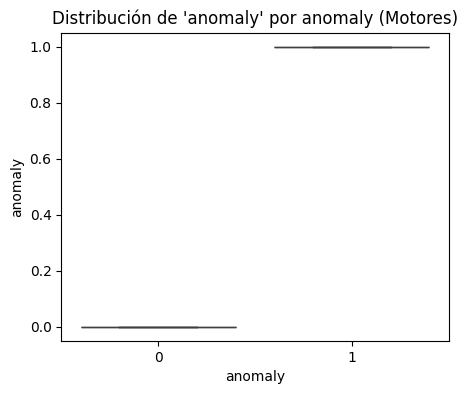

In [ ]:
# Boxplot para las variables del motor 1, comparando fallas y datos normales
for columna in df_completo.columns:
  plt.figure(figsize=(5, 4))
  sns.boxplot(x="anomaly", y=columna, data=df_completo)
  plt.title(f"Distribución de '{columna}' por anomaly (Motores)")
  plt.show()

In [ ]:
# Matriz de correlaciones
# Análisis de correlaciones
correlaciones_motores_com= df_completo.corr()
print(correlaciones_motores_com)

                   CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  \
CURRENT_A_CALC           1.000000        0.784827        0.770513   
CURRENT_B_CALC           0.784827        1.000000        0.956599   
CURRENT_C_CALC           0.770513        0.956599        1.000000   
CURRENT_D_CALC           0.753635        0.942078        0.953742   
POWER_A                  0.990577        0.807793        0.793422   
POWER_B                  0.785790        0.991113        0.958360   
POWER_C                  0.770040        0.955030        0.984172   
POWER_D                  0.752351        0.942374        0.952369   
TEMPERATURE_B            0.000597        0.228632        0.228112   
TEMPERATURE_C            0.002714        0.230523        0.229859   
TEMPERATURE_D            0.002280        0.230025        0.229333   
VOLTAGE_A               -0.386216       -0.591856       -0.582873   
VOLTAGE_B               -0.377840       -0.595725       -0.588569   
VOLTAGE_C               -0.370939 

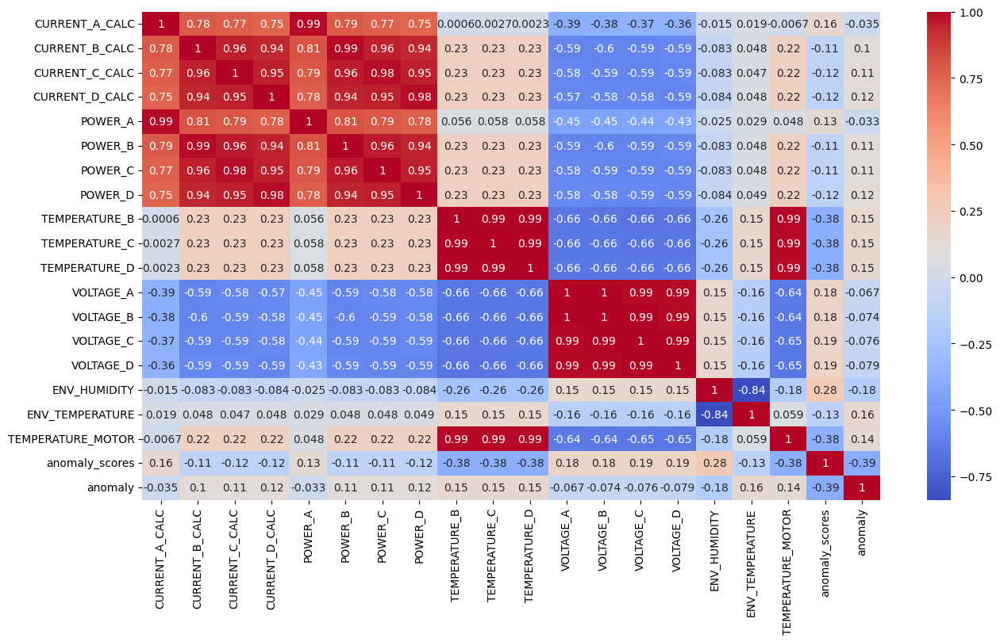

In [ ]:
#Graficamos Matriz de correlaciones
plt.figure(figsize = (15, 8))
sns.heatmap(correlaciones_motores_com, annot = True, cmap = "coolwarm") # heatmap: crea un mapa de calor apartir de la matriz de correlaciones
plt.show()

# <font color="green">**Análisis con leteratura**</font>

In [ ]:
# Ajustamos hiperparametros iForest con Grid Search
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import IsolationForest

# Tomamos datos de entrenamientos

X_train = df_completo.sample(frac=0.8, random_state=42)
X_test = df_completo.drop(X_train.index)

# Creamos el modelo
modelo = IsolationForest(random_state=42)

# Definimos los hiperparámetros a ajustar de acuerdo a la literatura
parametros_grid = {
    'n_estimators': [50, 100, 150, 200],
    'max_samples': [0.5, 0.75, 1.0],
    'contamination': [0.01, 0.05, 0.1]
}

In [ ]:
grid_search = GridSearchCV(estimator=modelo, param_grid=parametros_grid, scoring='f1', cv=5)
grid_search.fit(X_train)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 969, in _score
    scores = scorer(estimator, X_test, **score_params)
TypeError: _BaseScorer.__call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 969, in _score
    scores = scorer(estimator, X_test, **score_params)
TypeError: _BaseScorer.__call__() missing 1 required positional argument: 'y_true'

  warnings.

GridSearchCV(cv=5, estimator=IsolationForest(random_state=42),
             param_grid={'contamination': [0.01, 0.05, 0.1],
                         'max_samples': [0.5, 0.75, 1.0],
                         'n_estimators': [50, 100, 150, 200]},
             scoring='f1')

In [ ]:
# Obtenemos los mejores hiperparámetros
best_params = grid_search.best_params_
print("Mejores hiperparámetros:", best_params)

Mejores hiperparámetros: {'contamination': 0.01, 'max_samples': 0.5, 'n_estimators': 50}


**Ifores con los hiperparámetros establecidos anteriormente en el grid search**

In [ ]:
# Aplicamos Ifores con los hiperparámetros establecidos anteriormente en el grid search
modelo_entrenado = IsolationForest(n_estimators=best_params['n_estimators'],
                                   max_samples=best_params['max_samples'],
                                   contamination=best_params['contamination'],
                                   random_state=42)
modelo_entrenado.fit(df_hiper)

# Mejores hiperparámetros: {'contamination': 0.01, 'max_samples': 0.5, 'n_estimators': 50}

IsolationForest(contamination=0.01, max_samples=0.5, n_estimators=50,
                random_state=42)

In [ ]:
# Una vez el modelo entrenado pasomos a agregar el anmaly_score a la base de datos
df_hiper['anomaly_scores'] = modelo_entrenado.decision_function(df_hiper)

In [ ]:
df_hiper

,CURRENT_A_CALC,CURRENT_B_CALC,CURRENT_C_CALC,CURRENT_D_CALC,POWER_A,POWER_B,POWER_C,POWER_D,TEMPERATURE_B,TEMPERATURE_C,TEMPERATURE_D,VOLTAGE_A,VOLTAGE_B,VOLTAGE_C,VOLTAGE_D,ENV_HUMIDITY,ENV_TEMPERATURE,TEMPERATURE_MOTOR,anomaly_scores,anomaly
prueba,,,,,,,,,,,,,,,,,,,,
1,0.15,0.08,0.080,0.090,0.00,0.00,0.00,0.00,20.63,20.85,20.850,41.64,20.31,20.210,20.31,70.56,23.11,0.00,0.166703,0
2,0.14,0.08,0.090,0.070,0.00,0.00,0.00,0.00,20.63,20.63,20.630,41.64,20.31,20.210,20.31,70.56,23.11,0.00,0.164370,0
3,0.15,0.09,0.070,0.060,0.00,0.00,0.00,0.00,20.63,20.63,20.630,41.64,20.31,20.210,20.31,70.56,23.11,0.00,0.163345,0
3,0.19,0.08,0.090,0.100,0.00,0.00,0.00,0.01,20.63,20.54,20.540,41.62,20.30,20.210,20.30,70.56,23.11,0.00,0.155526,0
5,0.16,0.07,0.070,0.070,0.00,0.00,0.00,0.00,20.63,20.54,20.540,41.62,20.30,20.210,20.30,70.56,23.11,0.00,0.161082,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78882,0.42,11.29,8.460,7.110,0.01,0.58,0.44,0.37,54.58,54.58,54.210,30.39,14.82,14.765,14.83,70.92,22.72,31.21,0.118971,0
78883,0.41,6.44,2.220,8.035,0.01,0.33,0.12,0.15,54.58,54.58,54.115,30.39,14.79,14.760,14.83,70.92,22.72,31.21,0.109742,0
78884,0.18,7.18,7.020,8.960,0.01,0.37,0.36,0.46,54.58,54.58,54.020,30.38,14.81,14.750,14.82,70.92,22.72,31.21,0.140844,0


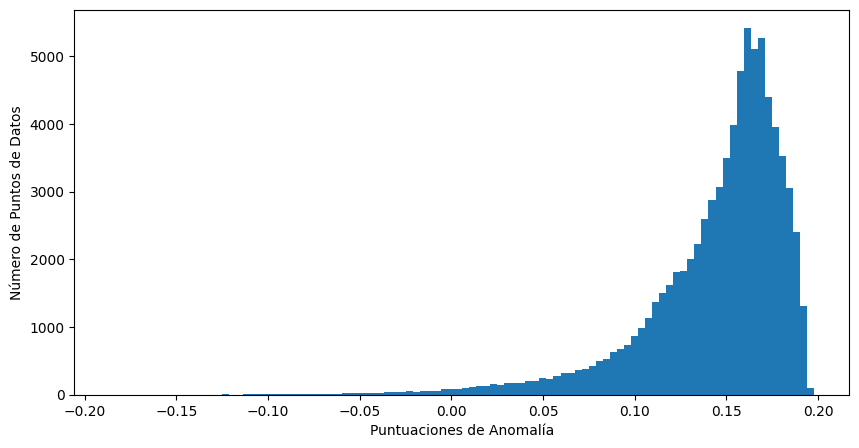

In [ ]:
plt.figure(figsize=(10, 5))
plt.hist(df_hiper.anomaly_scores, bins=100)
plt.xlabel("Puntuaciones de Anomalía")
plt.ylabel("Número de Puntos de Datos")
plt.show()

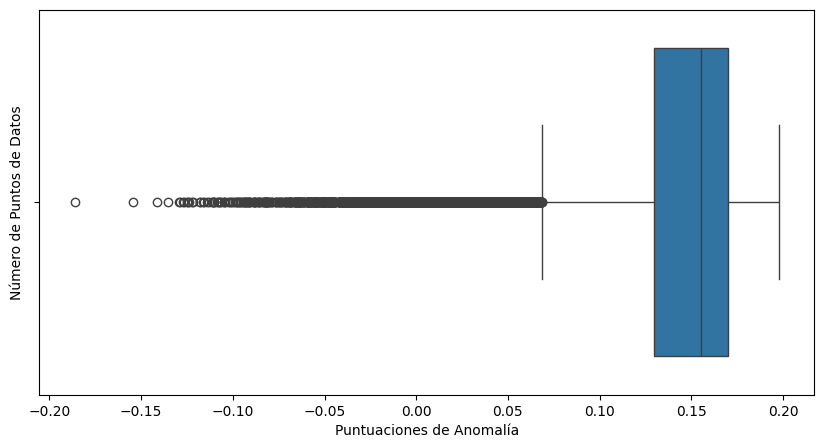

In [ ]:
## Gráficamos boxplot para la identificación de puntos atípicos con colores
plt.figure(figsize=(10, 5))
sns.boxplot(x=df_hiper.anomaly_scores)
plt.xlabel("Puntuaciones de Anomalía")
plt.ylabel("Número de Puntos de Datos")
plt.show()

In [ ]:
# Análisis Descriptivo
print(df_hiper.describe())

       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count    78886.000000    78886.000000    78886.000000    78886.000000   
mean         1.596111        7.809064        7.811574        7.821440   
std          1.155227        5.565275        5.553337        5.555169   
min          0.000000        0.000000        0.000000        0.000000   
25%          0.400000        2.180000        2.216250        2.230000   
50%          1.680000        8.110000        8.120000        8.110000   
75%          2.410000       11.840000       11.800000       11.810000   
max         12.370000       27.480000       34.100000       28.220000   

            POWER_A       POWER_B       POWER_C       POWER_D  TEMPERATURE_B  \
count  78886.000000  78886.000000  78886.000000  78886.000000   78886.000000   
mean       0.045954      0.404122      0.404036      0.404786      46.369449   
std        0.035039      0.290304      0.289068      0.289376      17.908512   
min        0.000000   

In [ ]:
# Calculo del rango intercualtilico para anomaly_score
Q1 = df_hiper.anomaly_scores.quantile(0.25)
Q3 = df_hiper.anomaly_scores.quantile(0.75)
IQR = Q3 - Q1
# Calculamos el umbral de anomalia considerando datos atípicos
umbral_anomalia = Q1 - 1.5*IQR
umbral_anomalia

0.06832172838553631

In [ ]:
# Calculo del rango intercualtilico para anomaly_score

Q1 = df_hiper.anomaly_scores.quantile(0.25)
Q3 = df_hiper.anomaly_scores.quantile(0.75)
IQR = Q3 - Q1
# Calculamos el umbral considerando datos atipicos hacia la derecha

umbral_anomalia = Q3 + 1.5*IQR
umbral_anomalia

0.2313138230555134

In [ ]:
# Definir el umbral para las anomalías
threshold = 0.06832172838553631
 #Buscando justificación

# Asignamos etiquetas: 1 para anomalía, 0 para normal
# Si la puntuación de anomalía es menor que el umbral, es una anomalía (etiqueta 1)
# Si la puntuación de anomalía es mayor o igual que el umbral, es normal (etiqueta 0)
labels = np.where(df_hiper.anomaly_scores < threshold, 1, 0)

#'labels' contiene las etiquetas para cada punto de datos en df
# 1 indica una anomalía, 0 indica un punto de datos normal

# Agregamos etiquetas al DataFrame:
df_hiper["anomaly"] = labels
#df["anomaly_label"] = labels
#df["anomaly_scores"] = anomaly_scores

In [ ]:
# Calculamos los percentiles para saber donde se encuentra el umbral

percentiles = np.linspace(0, 1, 101)

# Calculamos los percentiles
percentiles_calculados = df_hiper.anomaly_scores.quantile(percentiles)

# Muestra los resultados
print(percentiles_calculados.to_string())

0.00   -1.863304e-01
0.01    6.550953e-18
0.02    2.597251e-02
0.03    4.370246e-02
0.04    5.681682e-02
0.05    6.667091e-02
0.06    7.486451e-02
0.07    8.167424e-02
0.08    8.720331e-02
0.09    9.206644e-02
0.10    9.626643e-02
0.11    1.001543e-01
0.12    1.034681e-01
0.13    1.063134e-01
0.14    1.090460e-01
0.15    1.112447e-01
0.16    1.134645e-01
0.17    1.155473e-01
0.18    1.175536e-01
0.19    1.193996e-01
0.20    1.211948e-01
0.21    1.229504e-01
0.22    1.245831e-01
0.23    1.262610e-01
0.24    1.278605e-01
0.25    1.294438e-01
0.26    1.309655e-01
0.27    1.324542e-01
0.28    1.338574e-01
0.29    1.352534e-01
0.30    1.365203e-01
0.31    1.376744e-01
0.32    1.389280e-01
0.33    1.400094e-01
0.34    1.411206e-01
0.35    1.421427e-01
0.36    1.431980e-01
0.37    1.442492e-01
0.38    1.452149e-01
0.39    1.462571e-01
0.40    1.472085e-01
0.41    1.481829e-01
0.42    1.491180e-01
0.43    1.499536e-01
0.44    1.508094e-01
0.45    1.516286e-01
0.46    1.524903e-01
0.47    1.533

In [ ]:
# Análisis estadístico descriptivo de cada anomaly
for i in [0, 1]:  # Itera sobre las 2 anomaly: 0 y 1
    anomaly_data3 = df_hiper[df_hiper["anomaly"] == i]  # Filtra los datos del anomaly i
    print(f"\nanomaly {i}:")
    print(anomaly_data3.describe())  # Muestra estadísticas


anomaly 0:
       CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  CURRENT_D_CALC  \
count    74791.000000    74791.000000    74791.000000    74791.000000   
mean         1.609477        7.678391        7.669449        7.676134   
std          1.139181        5.414731        5.395268        5.381917   
min          0.000000        0.000000        0.000000        0.000000   
25%          0.420000        2.180000        2.201667        2.240000   
50%          1.710000        8.070000        8.075000        8.070000   
75%          2.420000       11.440000       11.400000       11.380000   
max          5.200000       24.430000       24.180000       23.530000   

            POWER_A       POWER_B       POWER_C       POWER_D  TEMPERATURE_B  \
count  74791.000000  74791.000000  74791.000000  74791.000000   74791.000000   
mean       0.046292      0.397212      0.396783      0.397100      45.182709   
std        0.034659      0.282140      0.280736      0.280092      16.228101   
min       

In [ ]:
df_hiper.anomaly.value_counts()

,count
anomaly,
0,74791
1,4095


In [ ]:
falla = (4095/len(df_hiper))*100
falla

5.191035164668002

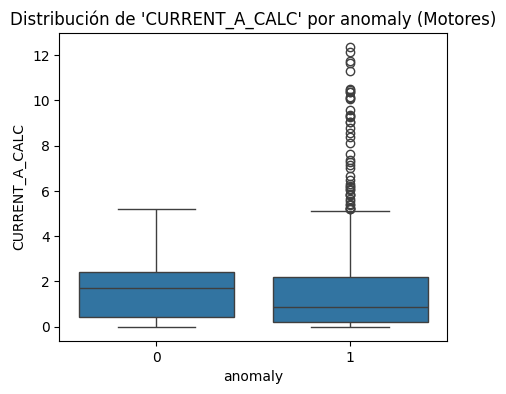

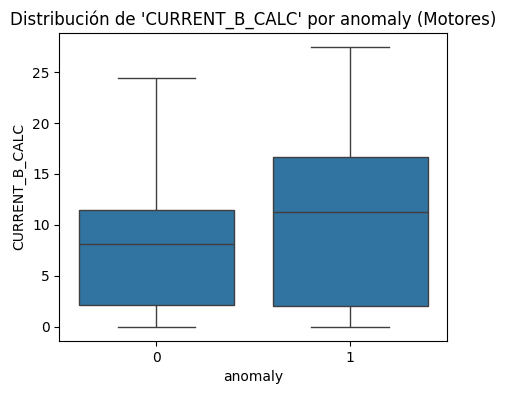

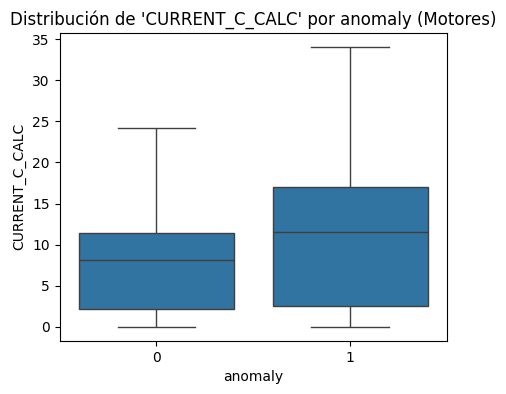

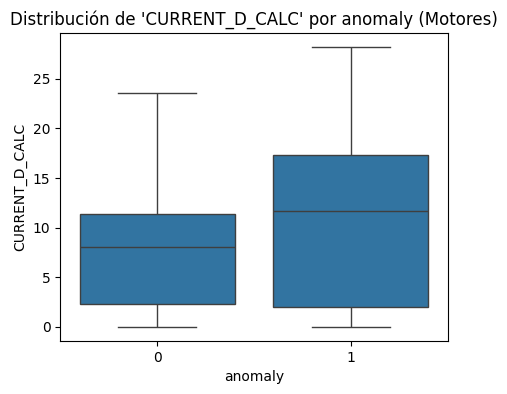

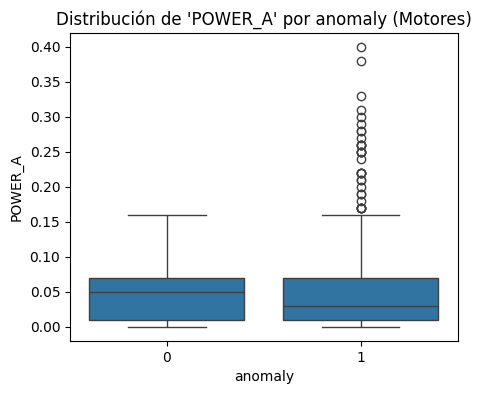

...

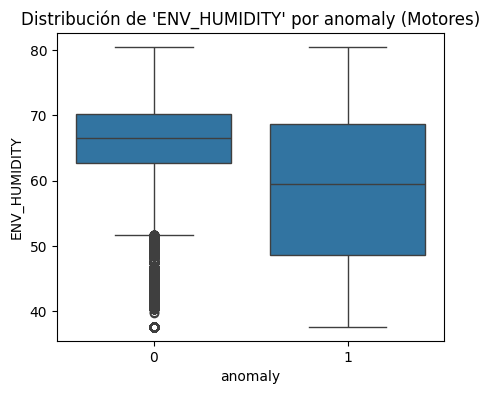

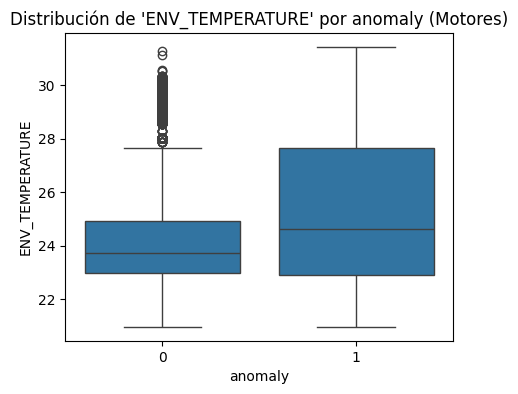

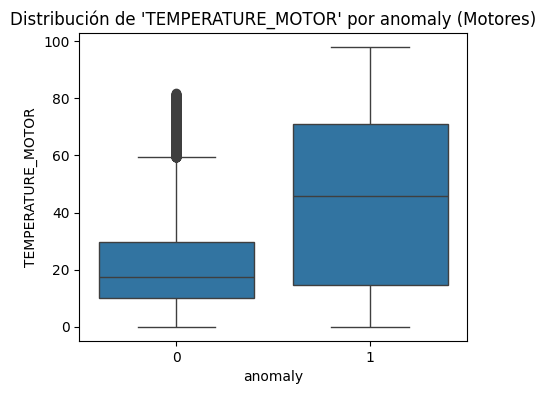

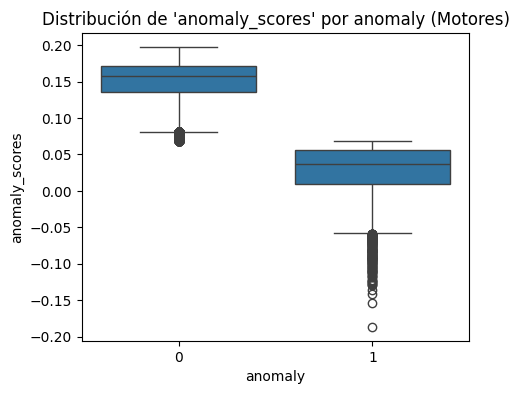

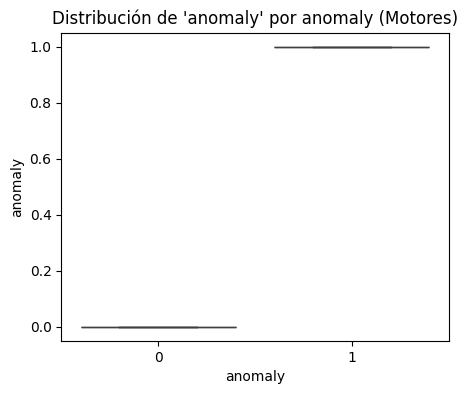

In [ ]:
# Boxplot para las variables del motor 1, comparando fallas y datos normales
for columna in df_hiper.columns:
  plt.figure(figsize=(5, 4))
  sns.boxplot(x="anomaly", y=columna, data=df_hiper)
  plt.title(f"Distribución de '{columna}' por anomaly (Motores)")
  plt.show()

In [ ]:
# Matriz de correlaciones
# Análisis de correlaciones
correlaciones_motores_h = df_hiper.corr()
print(correlaciones_motores_h)

                   CURRENT_A_CALC  CURRENT_B_CALC  CURRENT_C_CALC  \
CURRENT_A_CALC           1.000000        0.784827        0.770513   
CURRENT_B_CALC           0.784827        1.000000        0.956599   
CURRENT_C_CALC           0.770513        0.956599        1.000000   
CURRENT_D_CALC           0.753635        0.942078        0.953742   
POWER_A                  0.990577        0.807793        0.793422   
POWER_B                  0.785790        0.991113        0.958360   
POWER_C                  0.770040        0.955030        0.984172   
POWER_D                  0.752351        0.942374        0.952369   
TEMPERATURE_B            0.000597        0.228632        0.228112   
TEMPERATURE_C            0.002714        0.230523        0.229859   
TEMPERATURE_D            0.002280        0.230025        0.229333   
VOLTAGE_A               -0.386216       -0.591856       -0.582873   
VOLTAGE_B               -0.377840       -0.595725       -0.588569   
VOLTAGE_C               -0.370939 

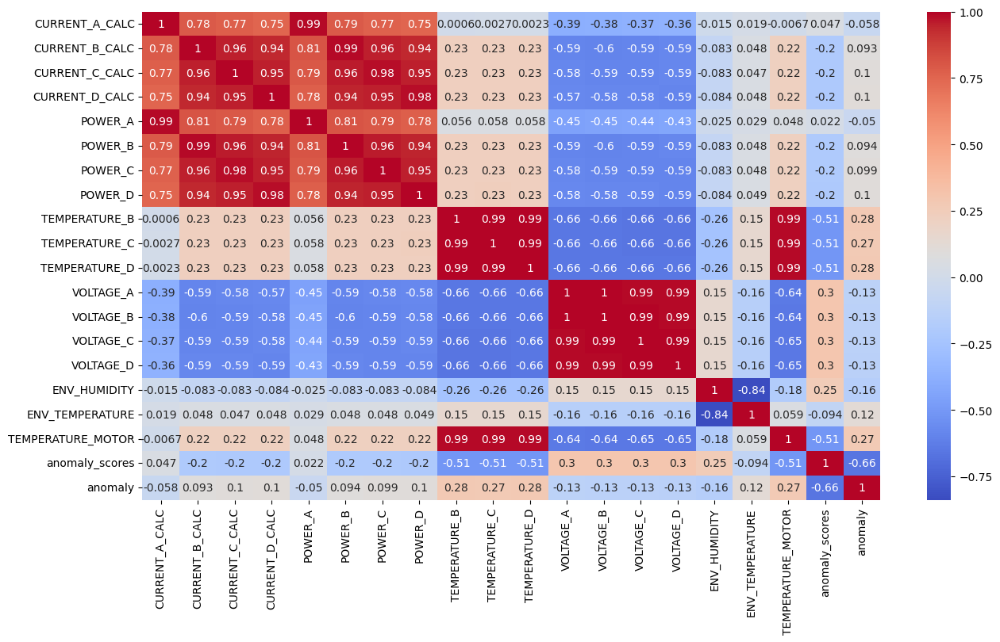

In [ ]:
#Graficamos Matriz de correlaciones
plt.figure(figsize = (15, 8))
sns.heatmap(correlaciones_motores_h, annot = True, cmap = "coolwarm") # heatmap: crea un mapa de calor apartir de la matriz de correlaciones
plt.show()

 ## <font color="green">**Anális de Series Temporales**</font>

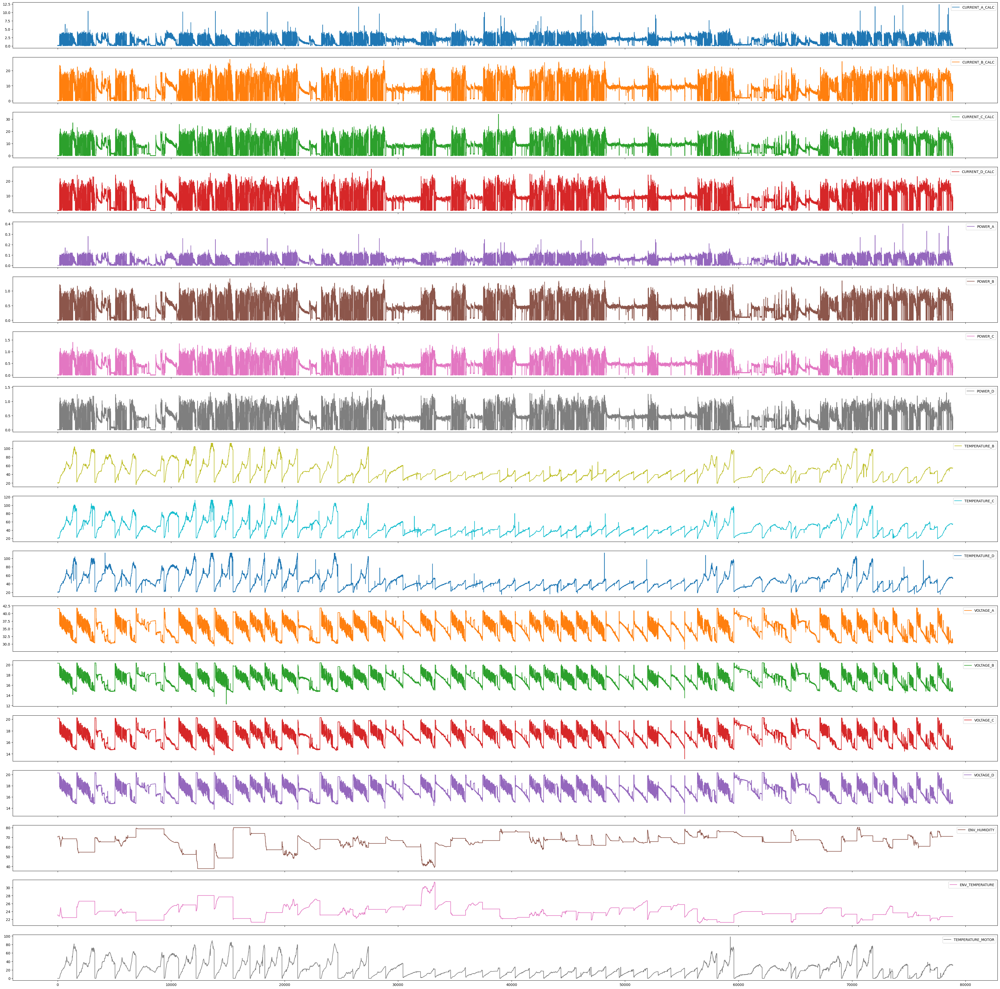

In [ ]:
# Visualization data before imputation
df_st.plot(subplots=True, figsize=(50,50))
plt.show()